# Modeling and validation
[Data source](https://www.kaggle.com/datasets/shubhamgoel27/dermnet)

About Dataset
Context
The data consists of images of 23 types of skin diseases taken from http://www.dermnet.com/dermatology-pictures-skin-disease-pictures. The total number of images are around 19,500, out of which approximately 15,500 have been split in the training set and the remaining in the test set.

Content
The images are in JPEG format, consisting of 3 channels, i.e. RGB. The resolutions vary from image to image, and from category to category, but overall these are not extremely high resolution imagery.

The categories include acne, melanoma, Eczema, Seborrheic Keratoses, Tinea Ringworm, Bullous disease, Poison Ivy, Psoriasis, Vascular Tumors, etc.

Acknowledgements
The images are taken from the public portal Dermnet (http://www.dermnet.com/) which is the largest dermatology source online built for the purpose of providing online medical education.

## Loading libraries

In [1]:
import os
import cv2
import random
import imageio
import zipfile
import numpy as np
import pandas as pd
import collections
import pandas as pd
import seaborn as sns
from PIL import Image, ImageOps
from functools import partial
import SimpleITK as sitk
import scipy.ndimage as ndi
from scipy.cluster import hierarchy
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.spatial import distance
from skimage import io, measure, morphology, data, exposure
from skimage.feature import canny, graycomatrix, graycoprops
from skimage.color import rgb2gray, label2rgb
from skimage.filters import gaussian, threshold_otsu, try_all_threshold
from skimage.segmentation import slic
from skimage.util import random_noise
from skimage.restoration import denoise_tv_chambolle
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, UpSampling2D, Input
from tensorflow.keras.datasets import cifar10
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, AgglomerativeClustering, DBSCAN
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score, adjusted_rand_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
import sklearn
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import warnings
warnings.simplefilter("ignore")

# pip list --format=freeze > requirements.txt

## Used functions

In [8]:
def add_padding_to_make_square(img):
    """
    Add padding to an image to make it square.
    """
    width, height = img.size
    if width == height:
        return img
    else:
        max_side = max(width, height)
        new_img = ImageOps.expand(img, (
            (max_side - width) // 2, 
            (max_side - height) // 2, 
            (max_side - width + 1) // 2, 
            (max_side - height + 1) // 2
        ), fill=(0, 0, 0))
        return new_img

def adjust_brightness(img, target_brightness):
    """
    Adjust the brightness of an image to match the target brightness.
    """
    grayscale_img = img.convert('L')
    img_array = np.array(grayscale_img)
    
    current_brightness = np.mean(img_array)
    brightness_factor = target_brightness / current_brightness
    
    img_array = np.array(img, dtype=np.float32)
    img_array = img_array * brightness_factor
    
    img_array = np.clip(img_array, 0, 255).astype(np.uint8)
    
    return Image.fromarray(img_array)

def normalize_images_brightness(images, target_brightness=None):
    """
    Normalize the brightness of all images to match the target brightness.
    """
    if target_brightness is None:
        total_brightness = 0
        for img in images:
            grayscale_img = img.convert('L')
            img_array = np.array(grayscale_img)
            total_brightness += np.mean(img_array)
        target_brightness = total_brightness / len(images)
    
    normalized_images = [adjust_brightness(img, target_brightness) for img in images]
    
    return normalized_images

def reduce_dimensions_pca(pca_components, features, do_plot=False):

    features = PCA(n_components=pca_components).fit_transform(features)

    pca = PCA().fit(features)

    if do_plot:
        plt.figure(figsize=(8,  4))
        plt.plot(range(1, len(pca.explained_variance_ratio_)+1), np.cumsum(pca.explained_variance_ratio_))
        plt.xlabel('number of components')
        plt.ylabel('cumulative explained variance');
    
    return features

def metrics_plots(max_k, X):

    score = []
    score_kmeans_s = []
    score_kmeans_c = []
    score_kmeans_d = []

    for k in range(2, max_k):
        kmeans = KMeans(n_clusters=k, random_state= 101)
        predictions = kmeans.fit_predict(X)
        # Calculate cluster validation metrics and append to lists of metrics
        score.append(kmeans.score(X))
        score_kmeans_s.append(silhouette_score(X, kmeans.labels_, metric='euclidean'))
        score_kmeans_c.append(calinski_harabasz_score(X, kmeans.labels_))
        score_kmeans_d.append(davies_bouldin_score(X, predictions))
        print(f'{k} ', end='')

    list_scores = [score, score_kmeans_s, score_kmeans_c, score_kmeans_d] 
    # Elbow Method plot
    list_title = ['Within-cluster sum of squares', 'Silhouette Score', 'Calinski Harabasz', 'Davies Bouldin'] 
    for i in range(len(list_scores)):
        x_ticks = list(range(2, len(list_scores[i]) + 2))
        plt.plot(x_ticks, list_scores[i], 'bx-')
        plt.xlabel('k')
        plt.ylabel(list_title[i])
        plt.title('Optimal k')
        plt.show()

def count_clustering_scores(X, cluster_num, model, score_fun):
    # Napiszmy tę funkcje tak ogólnie, jak to możliwe. 
    # Zwróćcie uwagę na przekazanie obiektów typu callable: model i score_fun.
    if isinstance(cluster_num, int):
        cluster_num_iter = [cluster_num]
    else:
        cluster_num_iter = cluster_num
        
    scores = []    
    for k in cluster_num_iter:
        model_instance = model(n_clusters=k)
        labels = model_instance.fit_predict(X)
        wcss = score_fun(X, labels)
        scores.append(wcss)
    
    if isinstance(cluster_num, int):
        return scores[0]
    else:
        return scores

def count_wcss_scores(X, k, model):
    #  WCSS = within-cluster sum of squares
    kmeans = model(n_clusters=k, random_state=0)
    kmeans.fit(X)
    return kmeans.score(X) * -1 # score returns -WCSS

def min_interclust_dist(X, label):
    clusters = set(label)
    global_min_dist = np.inf
    for cluster_i in clusters:
        cluster_i_idx = np.where(label == cluster_i)
        for cluster_j in clusters:
            if cluster_i != cluster_j:
                cluster_j_idx = np.where(label == cluster_j)
                interclust_min_dist = np.min(distance.cdist(X[cluster_i_idx], X[cluster_j_idx]))
                global_min_dist = np.min([global_min_dist, interclust_min_dist])
    return global_min_dist

def _inclust_mean_dists(X, label):
    clusters = set(label)
    inclust_dist_list = []
    for cluster_i in clusters:
        cluster_i_idx = np.where(label == cluster_i)
        inclust_dist = np.mean(distance.pdist(X[cluster_i_idx]))
        inclust_dist_list.append(inclust_dist)
    return inclust_dist_list

def mean_inclust_dist(X, label):
    inclust_dist_list = _inclust_mean_dists(X, label)
    return np.mean(inclust_dist_list)

def std_dev_of_inclust_dist(X, label):
    inclust_dist_list = _inclust_mean_dists(X, label)
    return np.std(inclust_dist_list)

def mean_dist_to_center(X, label):
    clusters = set(label)
    inclust_dist_list = []
    for cluster_i in clusters:
        cluster_i_idx = np.where(label == cluster_i)
        cluster_i_mean = np.mean(X[cluster_i_idx], axis=0, keepdims=True)
        inclust_dist = np.mean(distance.cdist(X[cluster_i_idx], cluster_i_mean))
        inclust_dist_list.append(inclust_dist)
    return np.mean(inclust_dist_list)

def create_data_frame(max_parameter, features):

    # Initialize an empty DataFrame
    df = pd.DataFrame()

    # Example data to add row by row
    algorithms = {
        'Kmeans': KMeans
    }
    metrics = {
        'min dist between clusters': min_interclust_dist,
        'mean dist in clust': mean_inclust_dist,
        'std dev dist in clust': std_dev_of_inclust_dist,
        'mean dist to clust center': mean_dist_to_center,
        'silhouette': silhouette_score,
    }

    index = 0
    # Add rows to the DataFrame in a for loop
    for i, algorithm in enumerate(algorithms):
        print('{0: <33}'.format(f'{algorithm}')+'[-', end='')
        for cluster_num in range(2, max_parameter+1):
            print(f'{cluster_num}-', end='')
            df.loc[index, ['Algorithm', 'Parameters']] = algorithm, cluster_num
            df.loc[index, 'Feature_len'] = len(features[0])
            df.loc[index, metrics.keys()] = [count_clustering_scores(X=features, cluster_num=cluster_num,
            model=algorithms[algorithm], score_fun=metrics[key]) for key in metrics]
            df.loc[index, 'WCSS'] = count_wcss_scores(features, cluster_num, algorithms[algorithm])
            index += 1
        print(']')
        
    return df

def plot_df(df):
    # List of metrics to plot
    metrics_vals = [
        'min dist between clusters',
        'mean dist in clust',
        'std dev dist in clust',
        'mean dist to clust center',
        'silhouette',
        'WCSS'
    ]

    # Set up the subplot grid (3 rows, 2 columns)
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))
    axes = axes.flatten()

    # Iterate over metrics and create a plot for each
    for i, metric in enumerate(metrics_vals):
        sns.lineplot(data=df, x='Parameters', y=metric, hue='Algorithm', marker='o', ax=axes[i])
        axes[i].set_title(f'{metric}')
        axes[i].set_ylabel(metric)
        axes[i].set_xlabel('Parameters')
        axes[i].legend(title='Algorithm')
        axes[i].grid(True)
    fig.suptitle('Clustering Performance Metrics vs Parameters', fontsize=16)

    # Adjust layout
    plt.tight_layout()
    plt.show()
    
def plot_clusters(images, labels, num_clusters):
    plt.figure(figsize=(20, 20))
    for cluster in range(num_clusters):
        cluster_images = images[labels == cluster]
        for i in range(min(len(cluster_images), 10)):
            plt.subplot(num_clusters, 10, cluster * 10 + i + 1)
            plt.imshow(cluster_images[i])
            plt.axis('off')
    plt.show()

## Making models: sharpened or thresholded data
#### Basic models & comparision


In [2]:
features_sharp_pcaa = np.load("C:\\Users\\HP\\ML\\Dermnet\\yfi\\features_sharp_pca.npy")
features_thre_pcaa = np.load("C:\\Users\\HP\\ML\\Dermnet\\yfi\\features_thre_pca.npy")
resized_images = np.load("C:\\Users\\HP\\ML\\Dermnet\\yfi\\resized_images.npy")
images = []              ### Image format
for idx, img_array_resized in enumerate(resized_images):
    img = Image.fromarray((img_array_resized * 255).astype(np.uint8))
    images.append(img)

In [3]:
### modele
from keras.layers import Input, Dense
from keras.models import Model
from keras import backend as K
from sklearn.cluster import KMeans
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, calinski_harabasz_score
def kmeans_clustering(features, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(features)
    return kmeans.labels_

def deep_embedded_clustering(features, n_clusters, batch_size=256, epochs=10):

    input_dim = features.shape[1]
    input_img = Input(shape=(input_dim,))
    encoded = Dense(500, activation='relu')(input_img)
    encoded = Dense(500, activation='relu')(encoded)
    encoded = Dense(2000, activation='relu')(encoded)
    encoded = Dense(10, activation='relu')(encoded)  # 10 to rozmiar kodu
    decoded = Dense(2000, activation='relu')(encoded)
    decoded = Dense(500, activation='relu')(decoded)
    decoded = Dense(500, activation='relu')(decoded)
    decoded = Dense(input_dim, activation='sigmoid')(decoded)

    autoencoder = Model(input_img, decoded)
    autoencoder.compile(optimizer='adam', loss='mse')

    autoencoder.fit(features, features, batch_size=batch_size, epochs=epochs)
    encoder = Model(input_img, encoded)
    codes = encoder.predict(features)
    kmeans = KMeans(n_clusters=n_clusters, n_init=20)
    cluster_labels = kmeans.fit_predict(codes)

    return cluster_labels
def hierarchical_clustering_avg(features, num_clusters):
    agg_clustering = AgglomerativeClustering(n_clusters=10, linkage='average')
    labels = agg_clustering.fit_predict(features)
    return labels


def agglomerative_clustering(features, num_clusters):
    agglomerative = AgglomerativeClustering(n_clusters=num_clusters)
    return agglomerative.fit_predict(features)

def display_cluster_images(cluster_labels, images):
    clusters = {}
    for i, label in enumerate(cluster_labels):
        if label not in clusters:
            clusters[label] = []
        clusters[label].append(images[i])

    for cluster, cluster_images in clusters.items():
        print(f"Cluster {cluster}: {cluster_images}")

def perform_clustering(model, features, num_clusters, images=None):
    if model == 'kmeans':
        labels = kmeans_clustering(features, num_clusters)
    elif model == 'hierarchical':
        labels = hierarchical_clustering_avg(features, num_clusters)
    elif model == 'dbscan':
        labels = dbscan_clustering(features)
    elif model == 'deep':
        labels = deep_embedded_clustering(features, num_clusters)
    elif model == 'agglomerative':
        labels = agglomerative_clustering(features, num_clusters)
    elif model == 'neural_network':
        labels = neural_network_clustering(features, num_clusters)
    else:
        raise ValueError("Invalid clustering model specified.")
    if images is not None:
        display_cluster_images(labels, images)
    return labels
def display_images_with_label(images, labels, target_label, num_images=10):
    indices = np.where(labels == target_label)[0]
    selected_indices = np.random.choice(indices, min(num_images, len(indices)), replace=False)

    fig, axes = plt.subplots(1, 10, figsize=(10, 4))
    axes = axes.ravel()

    for i, index in enumerate(selected_indices):
        axes[i].imshow(images[index])
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()
def calculate_silhouette_score(X, labels_list):
    """
    Calculate the Silhouette Score for the given clustering model and feature matrix.

    Parameters:
        model: Trained clustering model with a `labels_` attribute.
        X (array-like): Feature matrix of shape (n_samples, n_features).

    Returns:
        silhouette_score (float): Silhouette Score for the clustering model.
    """
    silhouette_score_value = []
    for i in labels_list:
        silhouette_score_value.append(silhouette_score(X, i))
    return silhouette_score_value
from sklearn.metrics import calinski_harabasz_score

def compare_clustering_results_calinski(features, labels_list):
    calinski_scores = []
    for labels in labels_list:
        calinski_score = calinski_harabasz_score(features, labels)
        calinski_scores.append(calinski_score)
    return calinski_scores
def _inclust_mean_dists(labels, features):
    unique_labels = np.unique(labels)
    inclust_dist_list = []
    for cluster_label in unique_labels:
        cluster_points = features[labels == cluster_label]
        inclust_dist = np.mean(distance.pdist(cluster_points))
        inclust_dist_list.append(inclust_dist)
    return inclust_dist_list


def mean_inclust_dist(features, labels):
    inclust_dist_list = _inclust_mean_dists(labels, features)
    return np.mean(inclust_dist_list)

def std_dev_of_inclust_dist(features, labels):
    inclust_dist_list = _inclust_mean_dists(labels, features)
    return np.std(inclust_dist_list)

##### how many clusters?

In [4]:
def elbow_method(data, max_k=20):
    distortions = []
    for i in range(1, max_k + 1):
        kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
        kmeans.fit(data)
        distortions.append(kmeans.inertia_)
    plt.plot(range(1, max_k + 1), distortions, marker='o')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion')
    plt.title('Elbow Method')
    plt.show()
from sklearn.metrics import silhouette_score

def silhouette_score_method(data, max_k=20):
    silhouette_scores = []
    for i in range(2, max_k + 1):
        kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
        kmeans.fit(data)
        labels = kmeans.labels_
        silhouette_scores.append(silhouette_score(data, labels))
    plt.plot(range(2, max_k + 1), silhouette_scores, marker='o')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score Method')
    plt.show()

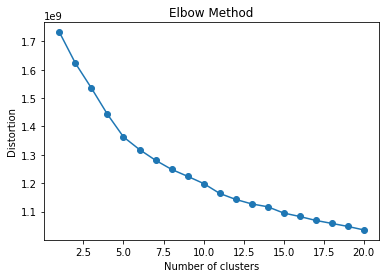

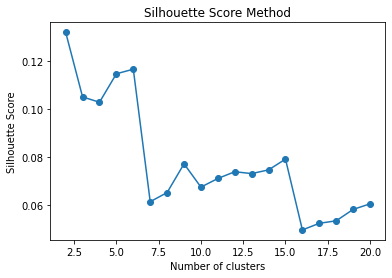

In [5]:
elbow_method(features_sharp_pcaa)
silhouette_score_method(features_sharp_pcaa)

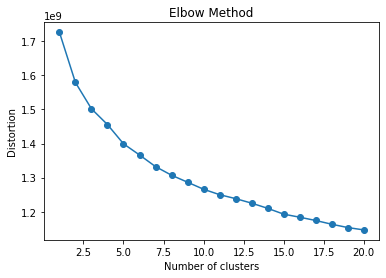

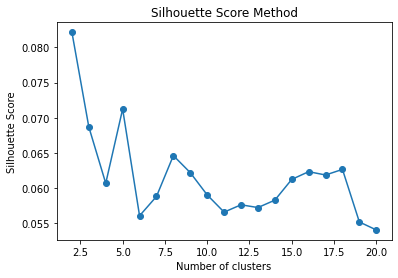

In [6]:
elbow_method(features_thre_pcaa)
silhouette_score_method(features_thre_pcaa)

In [6]:
###### model zrobiony po uwagach walidacji: jest on przeskalowany za pomocą StandardScaler oraz ma większą ilość cech
fet = np.load("C:\\Users\\HP\\ML\\WUM-Klasteryzacja\\FeatureEngineering\\more_pca.npy")

In [10]:
####### defining 4 models
kmeans_labels_sharp = perform_clustering('kmeans', fet, 10)
hierarchical_labels_sharp = perform_clustering('hierarchical', fet, 10)
agglomerative_labels_sharp = perform_clustering('agglomerative', fet, 10)
deep_embedded_labels_sharp = perform_clustering('deep', fet, 10)

Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 4.9996
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 4.8399
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - loss: 4.8384
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 4.8545
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 4.8338
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 4.8844
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 4.8794
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 4.8593
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 4.8876
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 4.8753
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


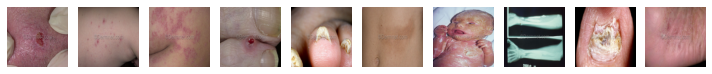

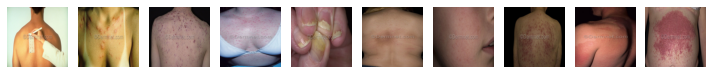

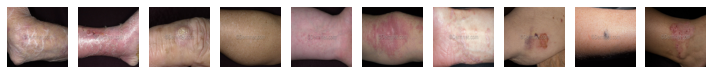

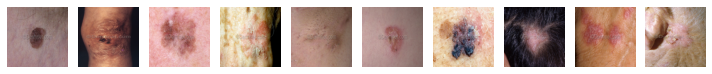

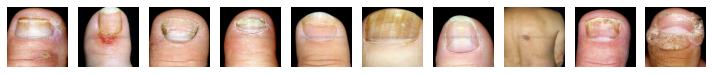

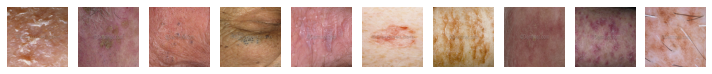

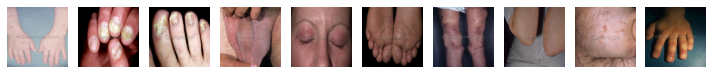

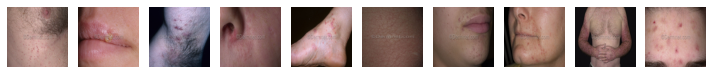

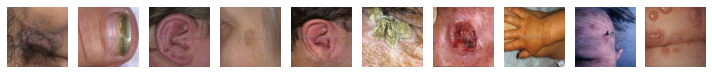

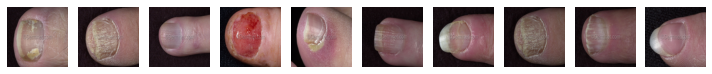

In [13]:
####### visualizations: agglomerative algorithm
for i in range(10):
    display_images_with_label(images, agglomerative_labels_sharp, i)

In [14]:
labels_list_thres = [kmeans_labels_sharp, hierarchical_labels_sharp, agglomerative_labels_sharp, deep_embedded_labels_sharp]


In [15]:
silhouette_scores_thres = calculate_silhouette_score(fet, labels_list_thres)


In [16]:
calinski_scores_thres = compare_clustering_results_calinski(fet, labels_list_thres)

In [19]:
nazwy_kolumn = ['kmeans', 'hierarchical', 'agglomerative', 'deep_embedded']
nazwy_wierszy = ['silhoue', 'calinski']
summary_sharp_table = pd.DataFrame([silhouette_scores_thres, calinski_scores_thres], columns = nazwy_kolumn, index = nazwy_wierszy)

In [20]:
summary_sharp_table


,kmeans,hierarchical,agglomerative,deep_embedded
silhoue,-0.020689,0.564729,-0.056739,-0.098330
calinski,56.717897,10.483137,48.987976,8.865924


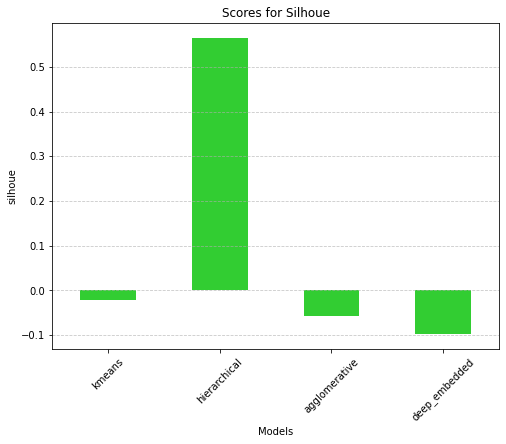

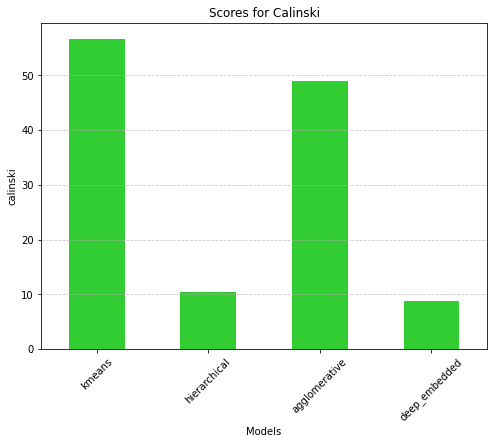

In [21]:

for idx, row_label in enumerate(summary_sharp_table.index):
    plt.figure(figsize=(8, 6))
    row_data = summary_sharp_table.loc[row_label]
    row_data.plot(kind='bar', color='limegreen')
    plt.title(f'Scores for {row_label.capitalize()}')
    plt.xlabel('Models')
    plt.ylabel(row_label)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

In [ ]:
####### models from the first group: sharpened images

In [7]:
####### defining 4 models
kmeans_labels_sharp = perform_clustering('kmeans', features_sharp_pcaa, 10)
hierarchical_labels_sharp = perform_clustering('hierarchical', features_sharp_pcaa, 10)
agglomerative_labels_sharp = perform_clustering('agglomerative', features_sharp_pcaa, 10)
deep_embedded_labels_sharp = perform_clustering('deep', features_sharp_pcaa, 10)

Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 4230.3887
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 4208.1519
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 4235.1289
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 4210.8989
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 4238.3340
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 4202.7163
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 4198.4287
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 4220.7725
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 4235.6484
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 4221.3809
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


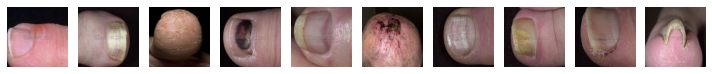

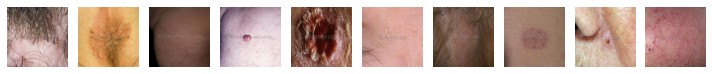

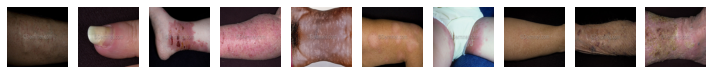

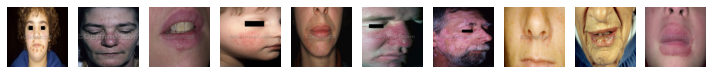

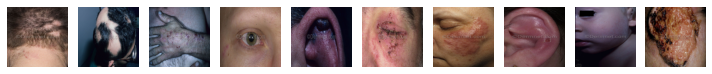

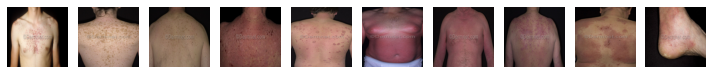

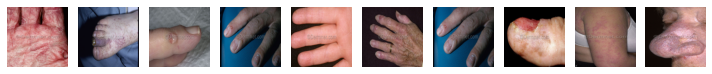

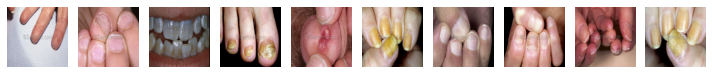

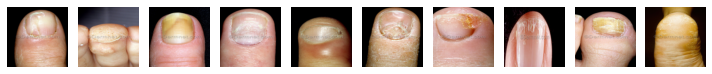

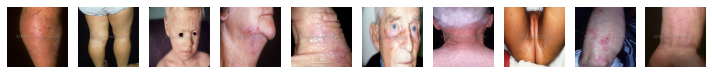

In [11]:
####### visualizations: kmeans algorithm
for i in range(10):
    display_images_with_label(images, kmeans_labels_sharp, i)

good clustering of fingers, faces and upper body parts

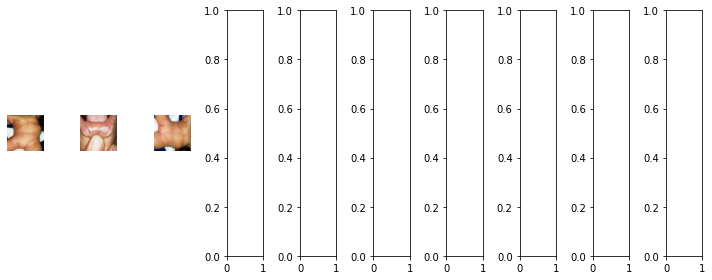

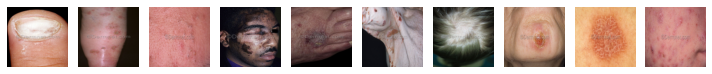

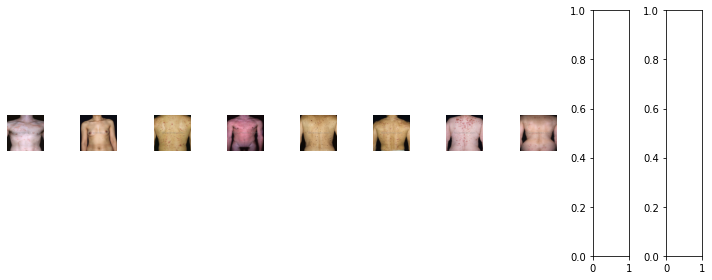

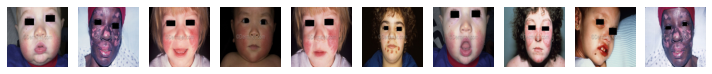

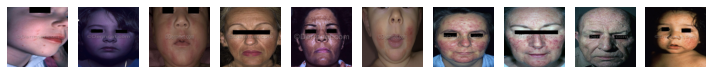

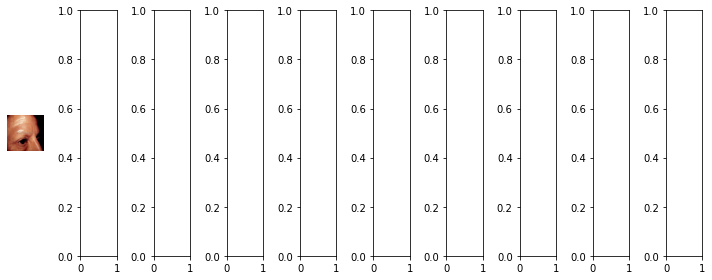

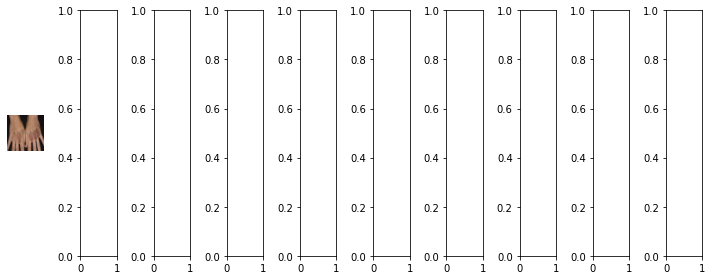

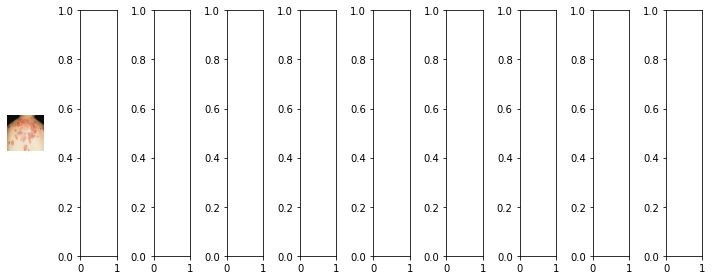

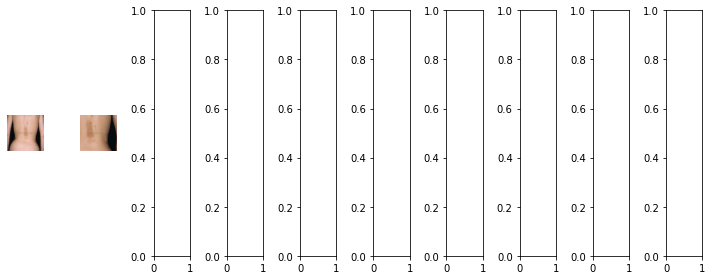

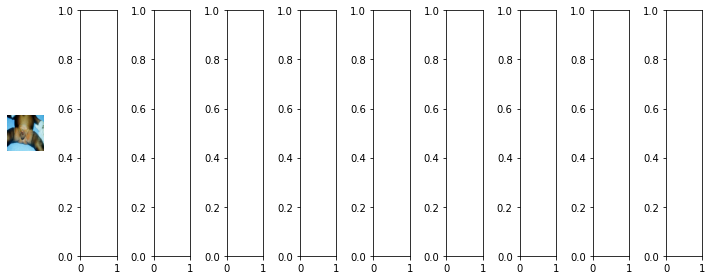

In [12]:
####### visualizations agglomerative average algorithm:
for i in range(10):
    display_images_with_label(images, hierarchical_labels_sharp, i)

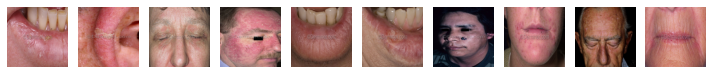

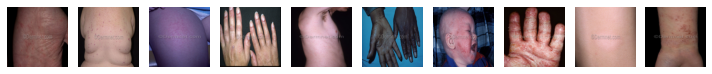

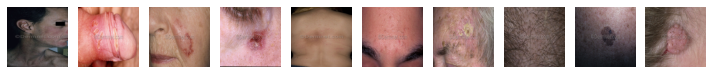

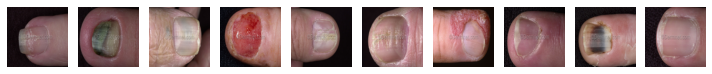

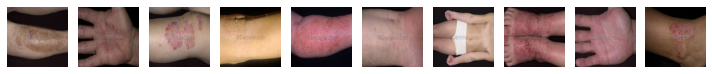

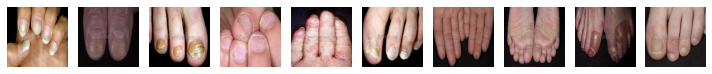

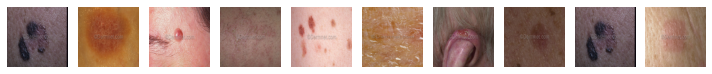

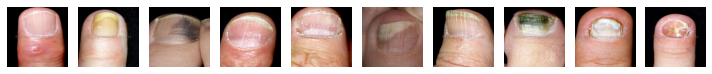

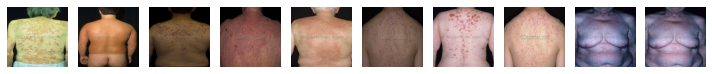

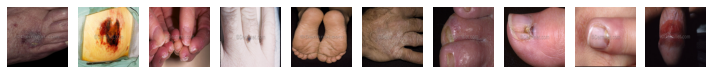

In [13]:
####### visualizations agglomerative algorithm:
for i in range(10):
    display_images_with_label(images, agglomerative_labels_sharp, i)

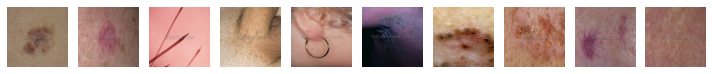

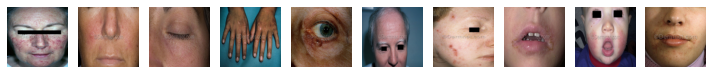

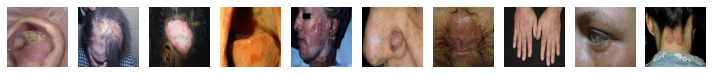

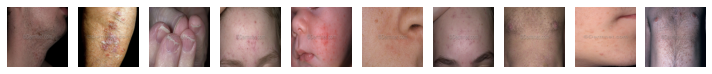

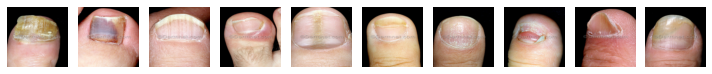

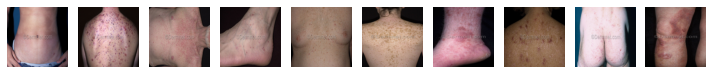

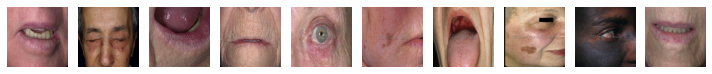

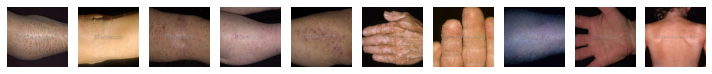

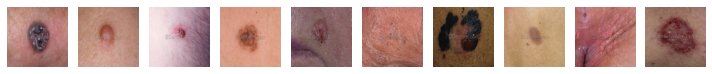

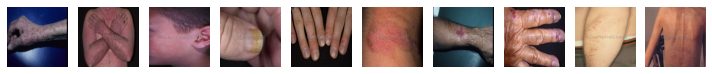

In [14]:
####### visualizations:deep_embedded algorithms
for i in range(10):
    display_images_with_label(images, deep_embedded_labels_sharp, i)

In [15]:
####### models from the secong=d group: thresholded images
hierarchical_labels_thres = perform_clustering('hierarchical', features_thre_pcaa, 10)
agglomerative_labels_thres = perform_clustering('agglomerative', features_thre_pcaa, 10)
kmeans_labels_thres = perform_clustering('kmeans', features_thre_pcaa, 10)
deep_embedded_labels_thres = perform_clustering('deep', features_thre_pcaa, 10)

Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 4179.6006
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 4255.1182
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 4201.6724
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 4242.7622
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 4199.6851
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 4202.3979
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 4224.1392
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 4237.0771
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 4183.4956
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 4241.3301
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


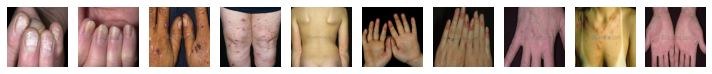

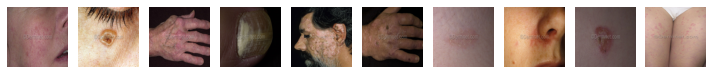

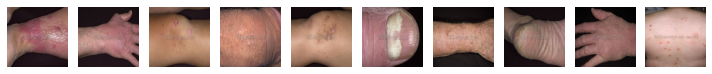

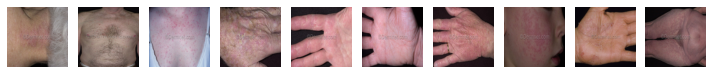

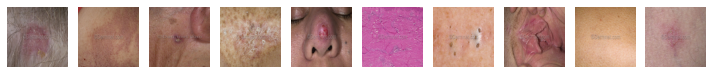

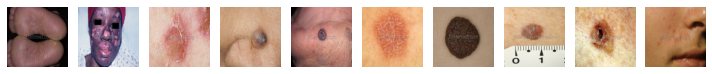

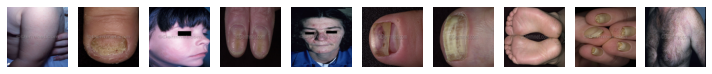

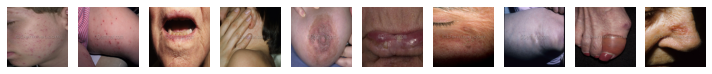

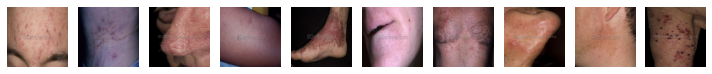

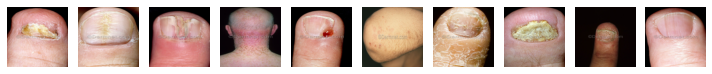

In [16]:
####### visualizations:  kmeans algorithm
for i in range(10):
    display_images_with_label(images, kmeans_labels_thres, i)

good recognition of fingers, moles and marks

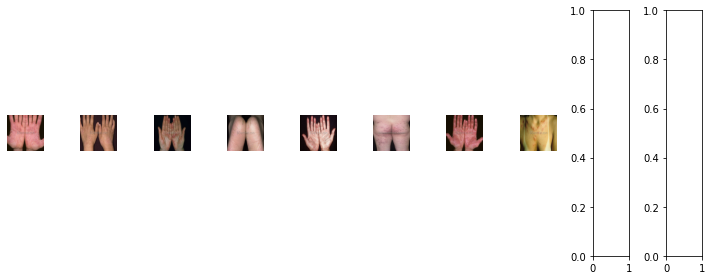

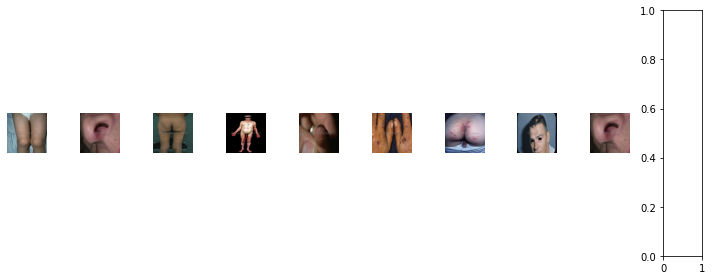

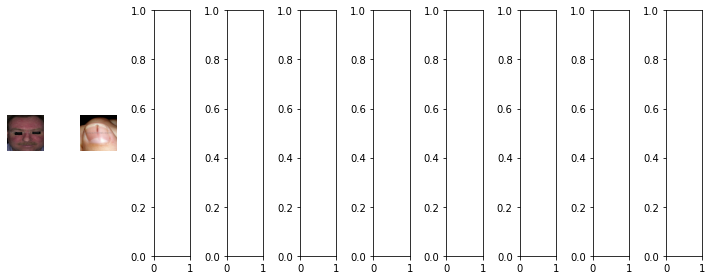

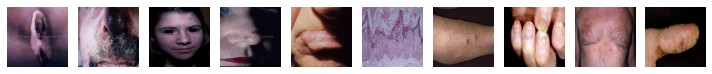

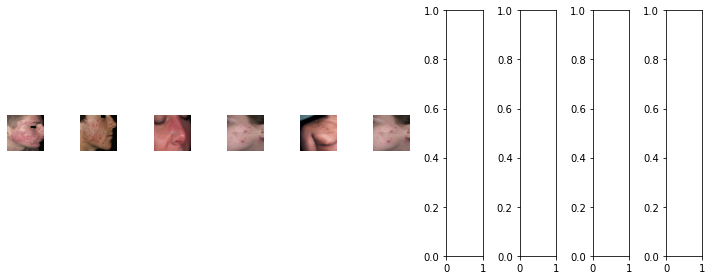

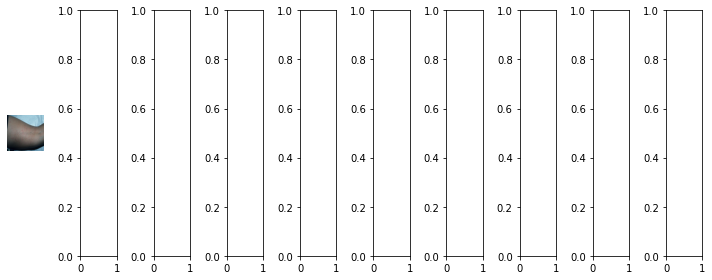

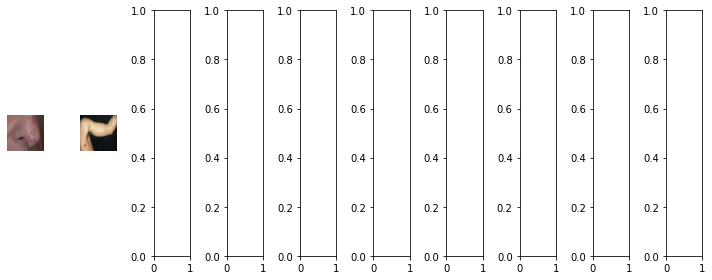

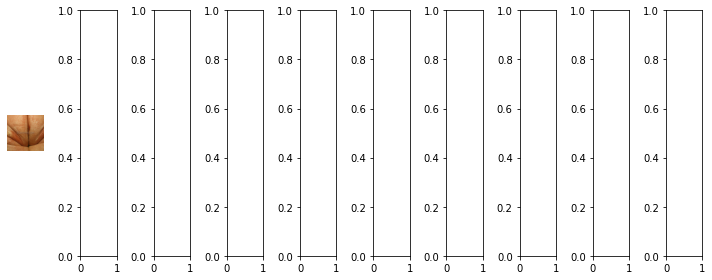

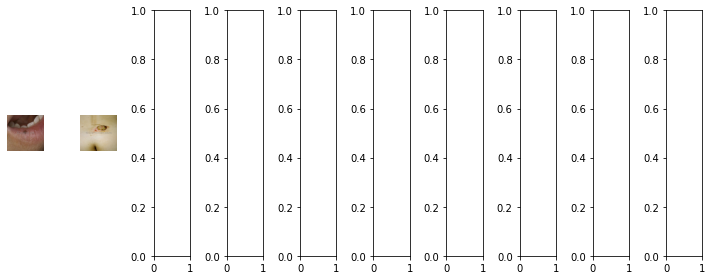

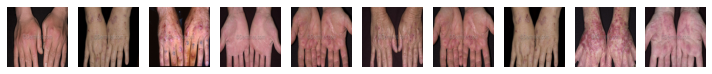

In [17]:
####### visualizations agglomerative average algorithm:
for i in range(10):
    display_images_with_label(images, hierarchical_labels_thres, i)

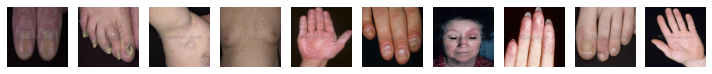

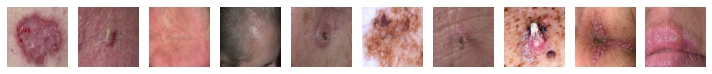

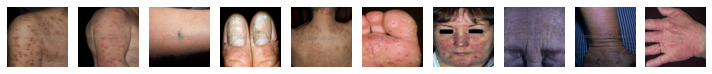

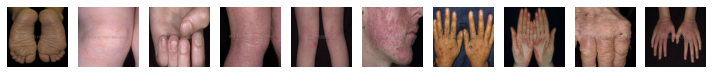

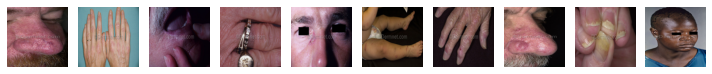

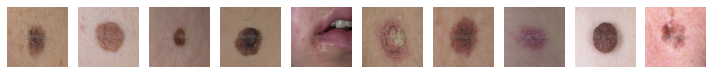

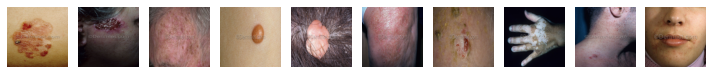

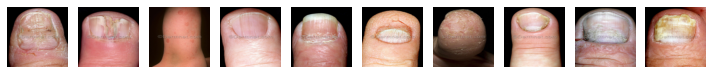

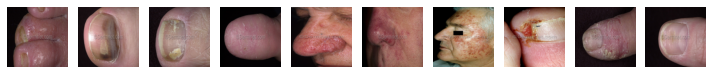

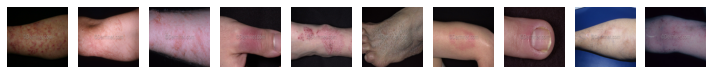

In [18]:
####### visualizations agglomerative algorithm:
for i in range(10):
    display_images_with_label(images, agglomerative_labels_thres, i)

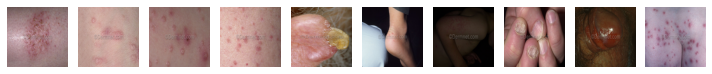

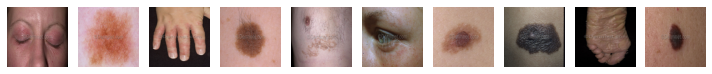

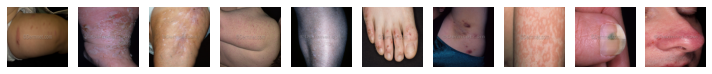

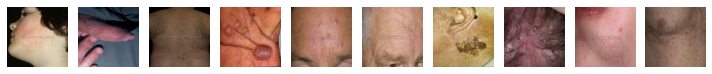

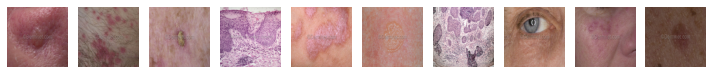

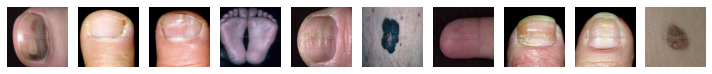

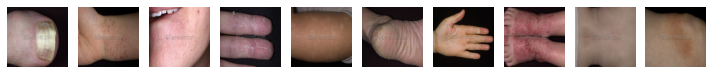

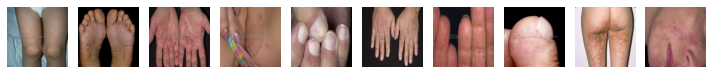

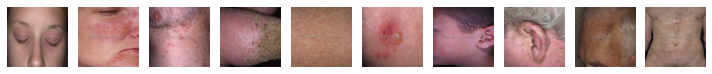

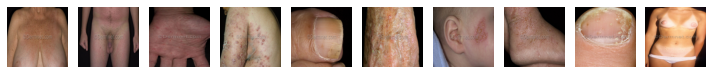

In [19]:
####### visualizations: deep_embedded algorithms
for i in range(10):
    display_images_with_label(images, deep_embedded_labels_thres, i)

In [20]:
labels_list_sharp = [kmeans_labels_sharp, hierarchical_labels_sharp, agglomerative_labels_sharp, deep_embedded_labels_sharp]
labels_list_thres = [kmeans_labels_thres, hierarchical_labels_thres, agglomerative_labels_thres, deep_embedded_labels_thres]

In [21]:
######### comparision:

In [22]:
######## sil
silhouette_scores_sharp = calculate_silhouette_score(features_sharp_pcaa, labels_list_sharp)
silhouette_scores_thres = calculate_silhouette_score(features_thre_pcaa, labels_list_thres)

In [23]:
######## calinski

In [24]:
calinski_scores_sharp = compare_clustering_results_calinski(features_sharp_pcaa, labels_list_sharp)
calinski_scores_thres = compare_clustering_results_calinski(features_thre_pcaa, labels_list_thres)

In [25]:
mean_dist_scores_sharp = []
mean_dist_scores_thres = []
std_dist_scores_sharp = []
std_dist_scores_thres = []

for i in labels_list_sharp:
    mean_dist_scores_sharp.append(mean_inclust_dist(features_sharp_pcaa, i))
    std_dist_scores_sharp.append(std_dev_of_inclust_dist(features_sharp_pcaa, i))

for i in labels_list_thres:
    mean_dist_scores_thres.append(mean_inclust_dist(features_thre_pcaa, i))
    std_dist_scores_thres.append(std_dev_of_inclust_dist(features_thre_pcaa, i))

In [26]:

nazwy_kolumn = ['kmeans', 'hierarchical', 'agglomerative', 'deep_embedded']
nazwy_wierszy = ['silhoue', 'calinski', 'mean dist', 'std_dist']
summary_sharp_table = pd.DataFrame([silhouette_scores_sharp, calinski_scores_sharp, mean_dist_scores_sharp, std_dist_scores_sharp], columns = nazwy_kolumn, index = nazwy_wierszy)

In [27]:
summary_sharp_table

,kmeans,hierarchical,agglomerative,deep_embedded
silhoue,0.079172,0.261090,0.027708,-0.020924
calinski,418.061221,45.842083,351.393304,264.499002
mean dist,572.407171,NaN,569.857610,566.919153
std_dist,110.108312,NaN,119.228409,151.168638


In [28]:
nazwy_kolumn = ['kmeans', 'hierarchical', 'agglomerative', 'deep_embedded']
nazwy_wierszy = ['silhoue', 'calinski', 'mean dist', 'std_dist']
summary_thres_table = pd.DataFrame([silhouette_scores_thres, calinski_scores_thres, mean_dist_scores_thres, std_dist_scores_thres], columns = nazwy_kolumn, index = nazwy_wierszy)


In [29]:
summary_thres_table

,kmeans,hierarchical,agglomerative,deep_embedded
silhoue,0.062798,0.193391,0.035815,0.024385
calinski,330.448072,11.352451,254.677912,195.630254
mean dist,561.045232,NaN,557.113555,592.581336
std_dist,85.973523,NaN,88.130958,66.353710


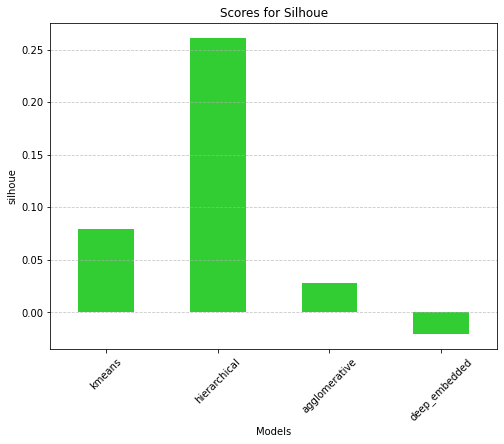

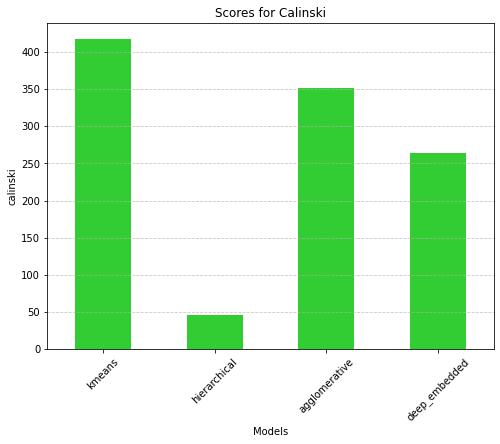

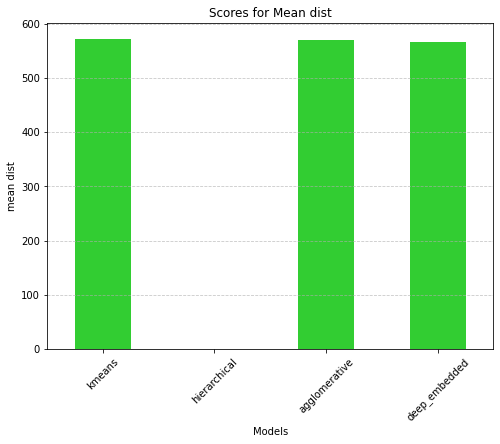

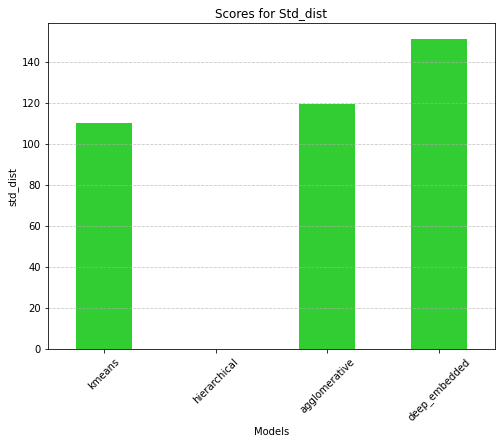

In [30]:
for idx, row_label in enumerate(summary_sharp_table.index):
    plt.figure(figsize=(8, 6))
    row_data = summary_sharp_table.loc[row_label]
    row_data.plot(kind='bar', color='limegreen')
    plt.title(f'Scores for {row_label.capitalize()}')
    plt.xlabel('Models')
    plt.ylabel(row_label)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

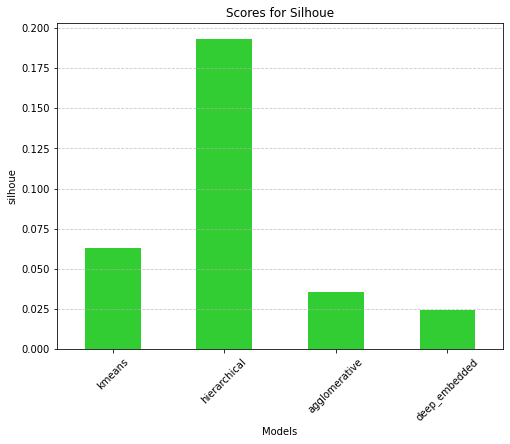

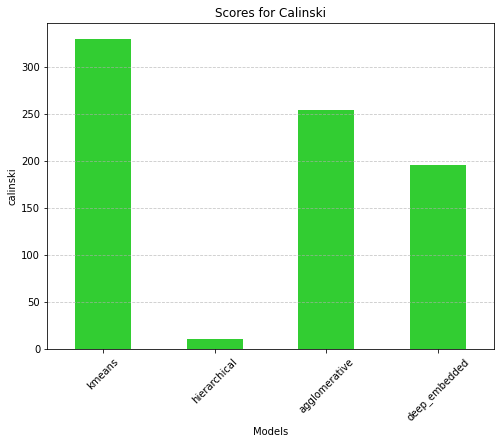

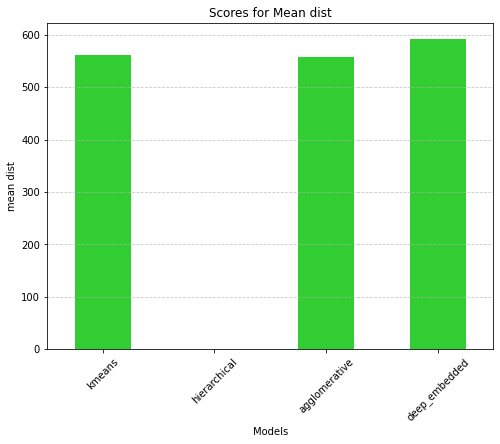

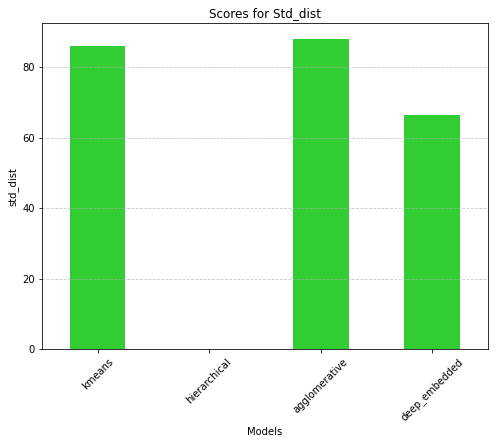

In [31]:
for idx, row_label in enumerate(summary_thres_table.index):
    plt.figure(figsize=(8, 6))
    row_data = summary_thres_table.loc[row_label]
    row_data.plot(kind='bar', color='limegreen')
    plt.title(f'Scores for {row_label.capitalize()}')
    plt.xlabel('Models')
    plt.ylabel(row_label)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

In [34]:
def kmeans_clustering(features):
    silhouette_scores = []
    calinski_scores = []
    cluster_labels_list = []
    for num_clusters in range(2, 21):
        kmeans = KMeans(n_clusters=num_clusters, random_state=42)
        labels = kmeans.fit_predict(features)
        cluster_labels_list.append(labels)
        
        silhouette = silhouette_score(features, labels)
        calinski = calinski_harabasz_score(features, labels)
        
        silhouette_scores.append(silhouette)
        calinski_scores.append(calinski)
    return silhouette_scores, calinski_scores, cluster_labels_list
def deep_embedded_clustering(features, batch_size=256, epochs=10):
    input_dim = features.shape[1]
    input_img = Input(shape=(input_dim,))

    encoded = Dense(500, activation='relu')(input_img)
    encoded = Dense(500, activation='relu')(encoded)
    encoded = Dense(2000, activation='relu')(encoded)
    encoded = Dense(10, activation='relu')(encoded)  # 10 is the code dimension
    decoded = Dense(2000, activation='relu')(encoded)
    decoded = Dense(500, activation='relu')(decoded)
    decoded = Dense(500, activation='relu')(decoded)
    decoded = Dense(input_dim, activation='sigmoid')(decoded)
    autoencoder = Model(input_img, decoded)
    autoencoder.compile(optimizer='adam', loss='mse')
    autoencoder.fit(features, features, batch_size=batch_size, epochs=epochs)
    encoder = Model(input_img, encoded)
    codes = encoder.predict(features)

    silhouette_scores = []
    calinski_scores = []
    cluster_labels_list = []

    for num_clusters in range(2, 21):
        kmeans = KMeans(n_clusters=num_clusters, n_init=20, random_state=42)
        labels = kmeans.fit_predict(codes)
        cluster_labels_list.append(labels)
        
        silhouette = silhouette_score(features, labels)
        calinski = calinski_harabasz_score(features, labels)
        
        silhouette_scores.append(silhouette)
        calinski_scores.append(calinski)

    return silhouette_scores, calinski_scores, cluster_labels_list

def agglomerative_clustering(features):
    silhouette_scores = []
    calinski_scores = []
    cluster_labels_list = []

    for num_clusters in range(2, 21):
        agglo = AgglomerativeClustering(n_clusters=num_clusters)
        labels = agglo.fit_predict(features)
        cluster_labels_list.append(labels)
        
        silhouette = silhouette_score(features, labels)
        calinski = calinski_harabasz_score(features, labels)
        
        silhouette_scores.append(silhouette)
        calinski_scores.append(calinski)

    return silhouette_scores, calinski_scores, cluster_labels_list
def plot_clustering_scores(silhouette_scores, calinski_scores):
    num_clusters_range = range(2, 21)

    # Create subplots
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

    # Silhouette Score Plot
    axs[0].plot(num_clusters_range, silhouette_scores, marker='o')
    axs[0].set_xlabel('Number of clusters')
    axs[0].set_ylabel('Silhouette score')
    axs[0].set_title('Silhouette score vs Number of clusters')
    axs[0].set_xticks(num_clusters_range)
    axs[0].grid(True)

    # Calinski-Harabasz Score Plot
    axs[1].plot(num_clusters_range, calinski_scores, marker='o')
    axs[1].set_xlabel('Number of clusters')
    axs[1].set_ylabel('Calinski-Harabasz score')
    axs[1].set_title('Calinski-Harabasz score vs Number of clusters')
    axs[1].set_xticks(num_clusters_range)
    axs[1].grid(True)

    # Display the plots
    plt.tight_layout()
    plt.show()

In [ ]:
### silhouette and calinski score for sharpened data and diffrent number of clusters:

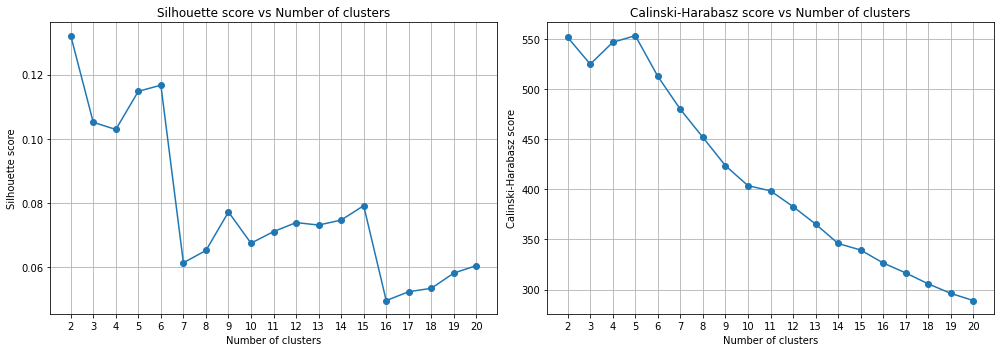

In [39]:
### kmeans clustering
silhouette_scores, calinski_scores, cluster_labels_list = kmeans_clustering(features_sharp_pcaa)
plot_clustering_scores(silhouette_scores, calinski_scores)

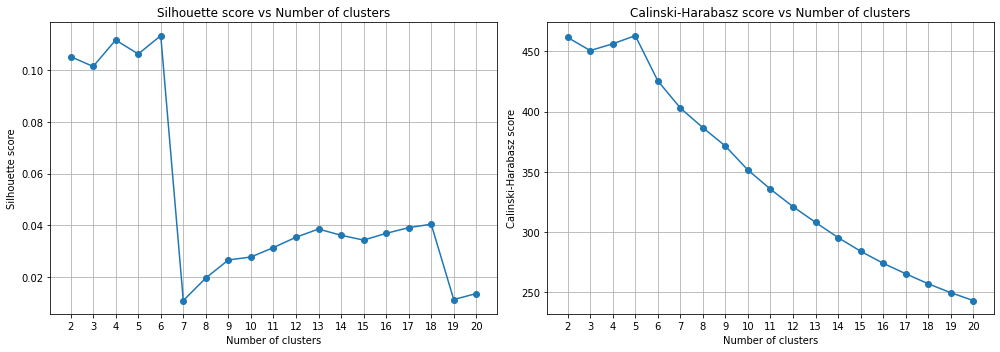

In [41]:
### agglomerative clustering
silhouette_scores_agg, calinski_scores_agg, cluster_labels_list_agg = agglomerative_clustering(features_sharp_pcaa)
plot_clustering_scores(silhouette_scores_agg, calinski_scores_agg)

Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 4217.8647
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 4192.3379
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 4225.7046
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 4211.3813
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 4189.2661
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 4219.8994
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 4190.4048
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 4205.2852
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 4248.2104
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 4198.8931
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


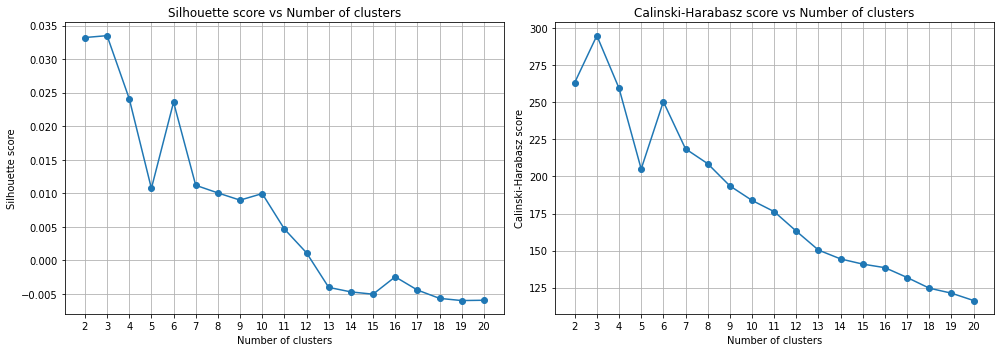

In [42]:
### deep embedded clustering
silhouette_scores_dp, calinski_scores_dp, cluster_labels_list_dp = deep_embedded_clustering(features_thre_pcaa)
plot_clustering_scores(silhouette_scores_dp, calinski_scores_dp)

In [ ]:
### silhouette score for thresholded data and different number of clusters:

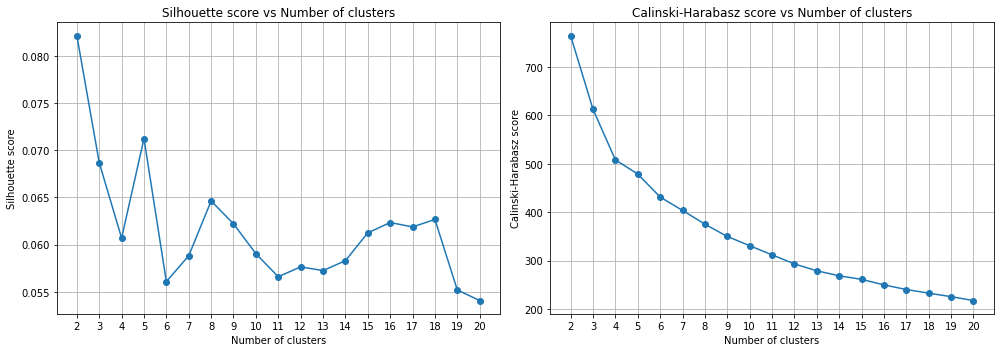

In [35]:
### kmeans clustering
silhouette_scores, calinski_scores, cluster_labels_list = kmeans_clustering(features_thre_pcaa)
plot_clustering_scores(silhouette_scores, calinski_scores)

In [36]:
### agglomerative clustering

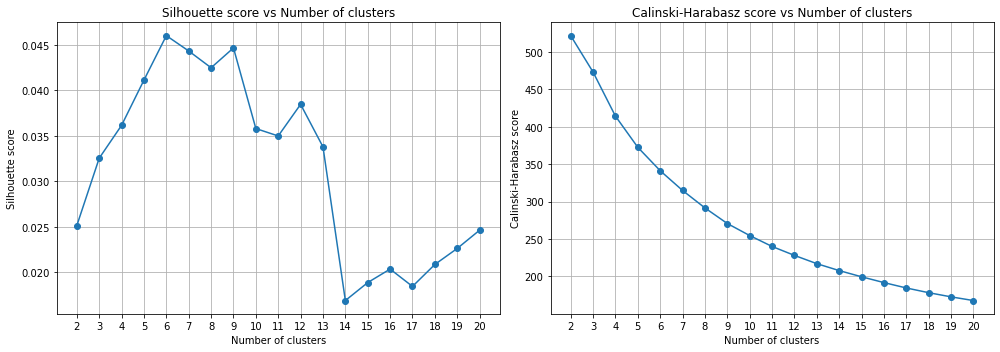

In [40]:
silhouette_scores_agg, calinski_scores_agg, cluster_labels_list_agg = agglomerative_clustering(features_thre_pcaa)
plot_clustering_scores(silhouette_scores_agg, calinski_scores_agg)

In [ ]:
### deep embedded clustering

Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 4180.6470
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 4213.7910
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 4215.9189
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 4202.8579
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 4204.0361
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 4236.8481
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 4205.6289
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 4246.9355
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 4215.9146
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 4189.1992
256/256 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


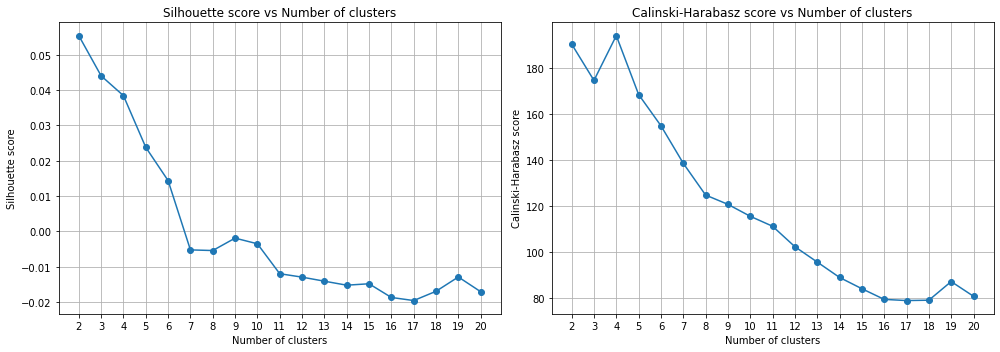

In [43]:
silhouette_scores_dp, calinski_scores_dp, cluster_labels_list_dp = deep_embedded_clustering(features_thre_pcaa)
plot_clustering_scores(silhouette_scores_dp, calinski_scores_dp)

### conclusions

Models were built for data with thresholds and sharpened data. The Silhouette Score and Calinski-Harabasz Score metrics were compared for various numbers of clusters. The models effectively recognize faces, hands, fingers, as well as birthmarks and other body marks, as these are the most distinctive parts of the body. None of the models achieved spectacular results, leading to the conclusion that the threshold does not positively affect the outcomes. The next section involves modeling on different data, where the results are much better and provide more satisfying outcomes.

## Modeling and validation for CNN model and KMeans algorithm

### Testing without standarization

In [4]:
# Load images from directory and pad them to be square, then resize to 32x32
data_dir = '../Data/train'
img_size = 32
images = []
for root, dirs, files in os.walk(data_dir):
    for file in files[:500]:
        if file.endswith('.jpg'):
            file_path = os.path.join(root, file)
            img = Image.open(file_path)
            img = add_padding_to_make_square(img)
            img = img.resize((img_size, img_size))
            images.append(img)

# Normalize the brightness of all images
normalized_images = normalize_images_brightness(images)

# Convert normalized images to numpy array
images_array = np.array([np.array(img) / 255.0 for img in normalized_images])

print(f"Shape of the images array: {images_array.shape}")

Shape of the images array: (9957, 32, 32, 3)


In [5]:
# Define the autoencoder model
input_img = Input(shape=(img_size, img_size, 3))  # Adjust shape based on your images

# Feature layers to plot later
layers = []

# Encoder
x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
layers.append(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
layers.append(x)
x = MaxPooling2D((2, 2), padding='same')(x)
encoded = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
layers.append(encoded)

# Decoder
x = Conv2D(128, (3, 3), activation='relu', padding='same')(encoded)
layers.append(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
layers.append(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)
layers.append(decoded)

# Autoencoder
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

# Train the autoencoder
train, test = train_test_split(images_array, test_size=0.7, random_state=42)
autoencoder.fit(train, test,
                epochs=50,
                batch_size=256,
                shuffle=True,
                validation_split=0.2)

# Create encoder model
encoder = Model(input_img, encoded)

# Extract features
features = encoder.predict(images_array)
features = features.reshape((features.shape[0], -1))  # Flatten the features for clustering
features_original = features.copy()

Epoch 1/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 190ms/step - loss: 0.5882 - val_loss: 0.4414
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - loss: 0.4289 - val_loss: 0.4217
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 171ms/step - loss: 0.4160 - val_loss: 0.4172
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 173ms/step - loss: 0.4147 - val_loss: 0.4158
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 172ms/step - loss: 0.4099 - val_loss: 0.4135
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - loss: 0.4076 - val_loss: 0.4179
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 172ms/step - loss: 0.4073 - val_loss: 0.4092
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 173ms/step - loss: 0.4041 - val_loss: 0.4083
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 180ms/step - loss: 0.4026 - val_loss: 0.4075
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 174ms/step - loss: 0.4016 - val_loss: 0.4075
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 189ms/step - loss: 0.4024 - val_loss: 0.4066
Epoch 12/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 174ms/step

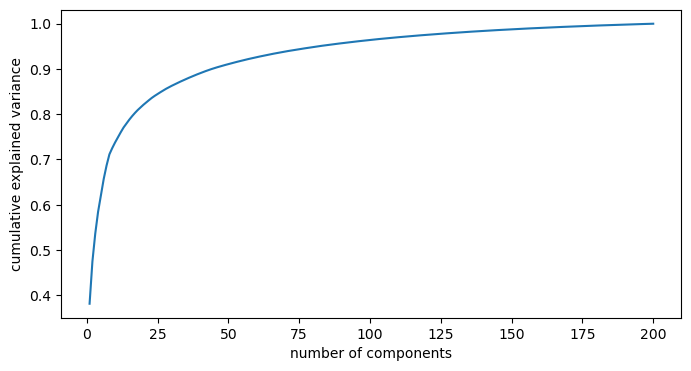

In [6]:
features = reduce_dimensions_pca(200, features_original, True)

2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 

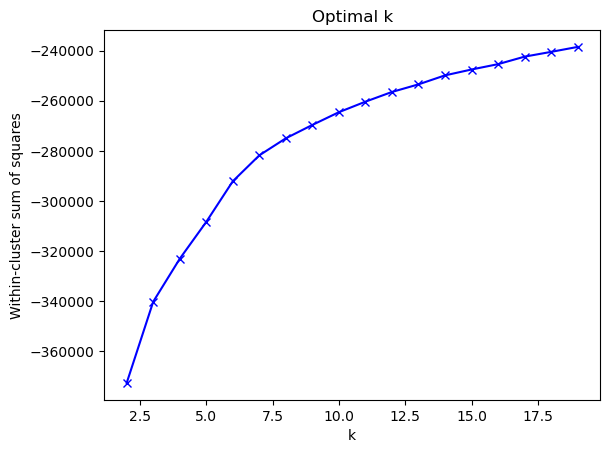

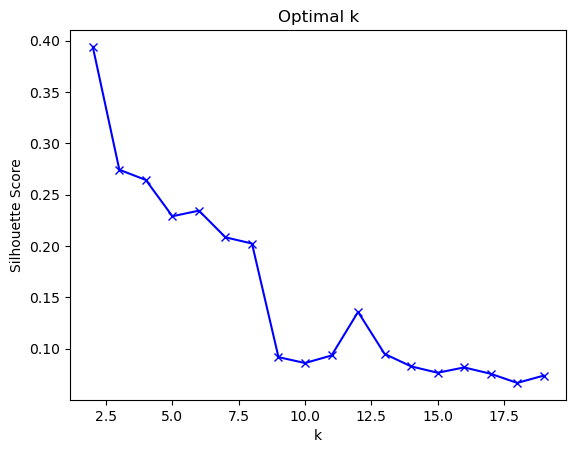

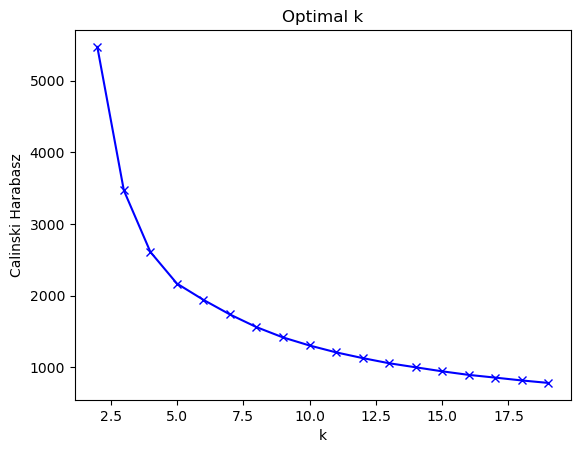

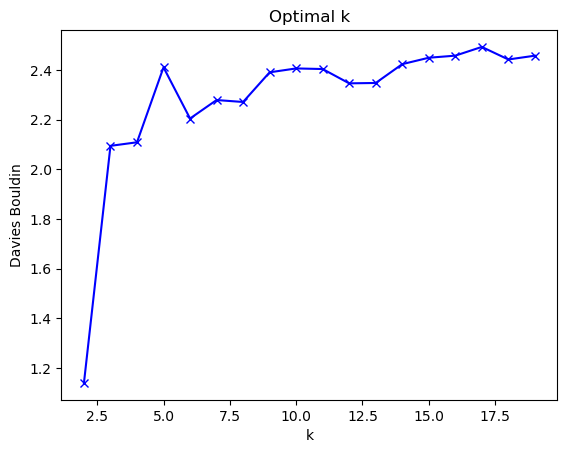

In [7]:
metrics_plots(20, features)

In [8]:
df = create_data_frame(25, features)
df.head()

Kmeans                           [-2-3-4-5-6-7-8-9-10-11-12-13-14-15-16-17-18-19-20-21-22-23-24-25-]


,Algorithm,Parameters,Feature_len,min dist between clusters,mean dist in clust,std dev dist in clust,mean dist to clust center,silhouette,WCSS
0,Kmeans,2.0,200.0,2.008525,8.382941,0.500912,5.826428,0.393913,372563.40625
1,Kmeans,3.0,200.0,0.976366,8.467531,1.893383,5.906646,0.274742,340165.56250
2,Kmeans,4.0,200.0,0.041590,8.495167,1.755821,5.921991,0.264014,323046.59375
3,Kmeans,5.0,200.0,1.034665,8.102843,1.772385,5.668155,0.243494,306287.87500
4,Kmeans,6.0,200.0,1.034665,8.182763,1.908296,5.729849,0.217104,292137.31250


In [10]:
df

,Algorithm,Parameters,Feature_len,min dist between clusters,mean dist in clust,std dev dist in clust,mean dist to clust center,silhouette,WCSS
0,Kmeans,2.0,200.0,2.008525,8.382941,0.500912,5.826428,0.393913,372563.406250
1,Kmeans,3.0,200.0,0.976366,8.467531,1.893383,5.906646,0.274742,340165.562500
2,Kmeans,4.0,200.0,0.041590,8.495167,1.755821,5.921991,0.264014,323046.593750
3,Kmeans,5.0,200.0,1.034665,8.102843,1.772385,5.668155,0.243494,306287.875000
4,Kmeans,6.0,200.0,1.034665,8.182763,1.908296,5.729849,0.217104,292137.312500
5,Kmeans,7.0,200.0,1.034665,8.086576,1.835682,5.661364,0.209174,281801.375000
6,Kmeans,8.0,200.0,1.034665,8.103937,1.784103,5.673912,0.203067,274999.781250
7,Kmeans,9.0,200.0,0.946990,8.095790,1.711496,5.697511,0.201300,269352.812500
8,Kmeans,10.0,200.0,0.870044,7.854003,1.963537,5.666797,0.163428,264292.625000
9,Kmeans,11.0,200.0,0.792280,7.872533,1.967841,5.540334,0.150784,260303.750000


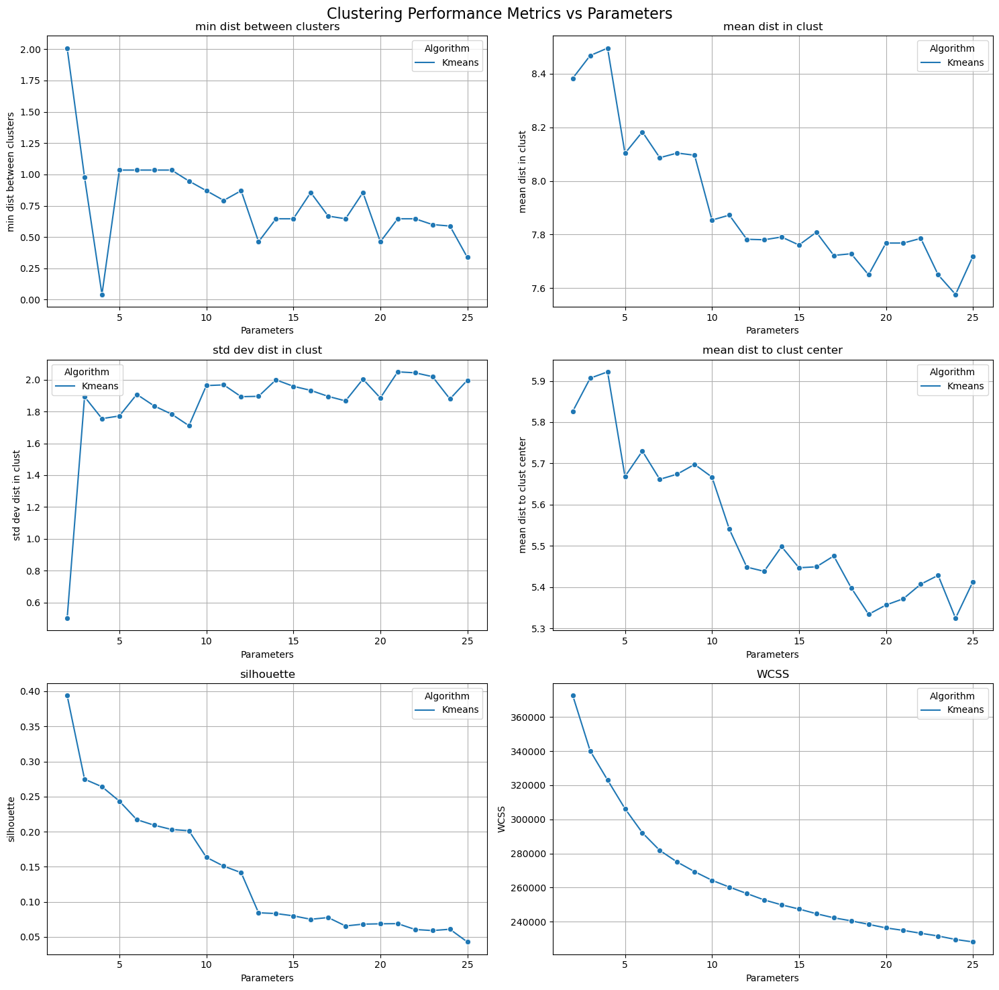

In [11]:
plot_df(df)

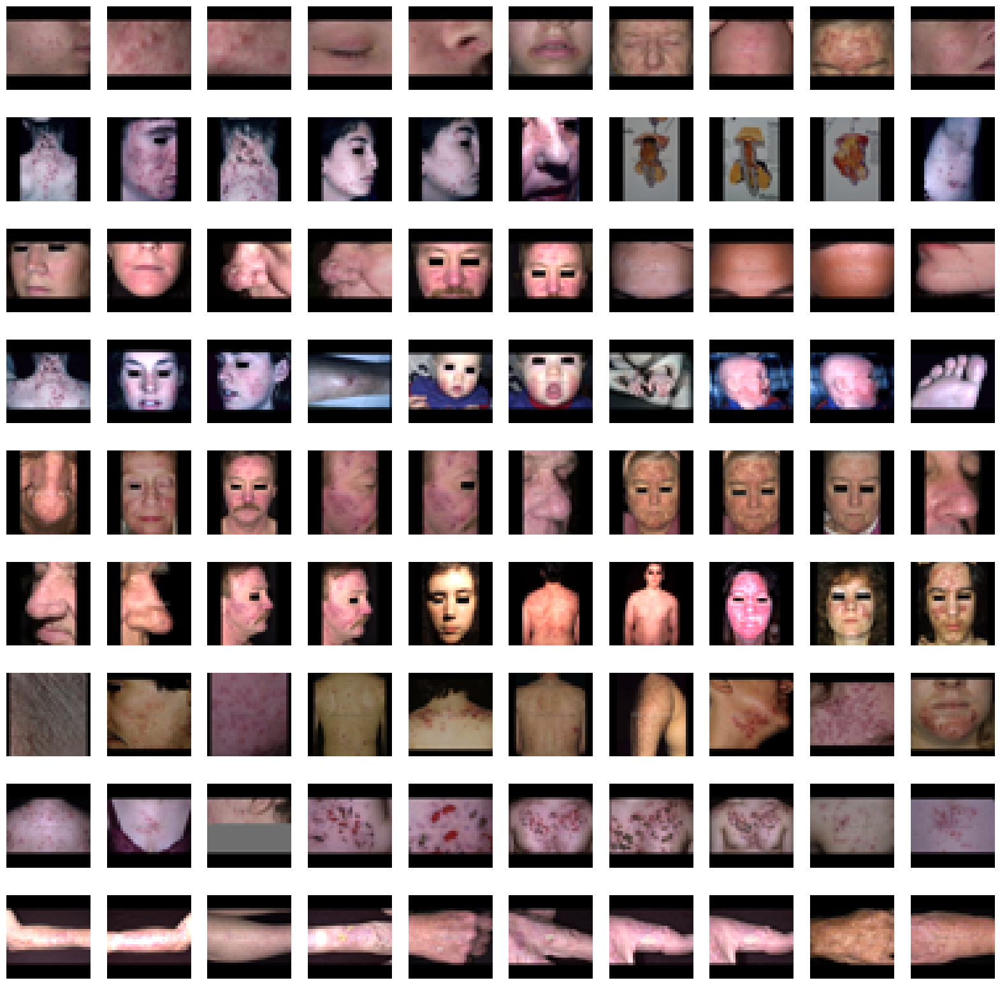

In [13]:
# Define the number of clusters
num_clusters = 9  # Choose an appropriate number of clusters

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(features)

plot_clusters(images_array, clusters, num_clusters)

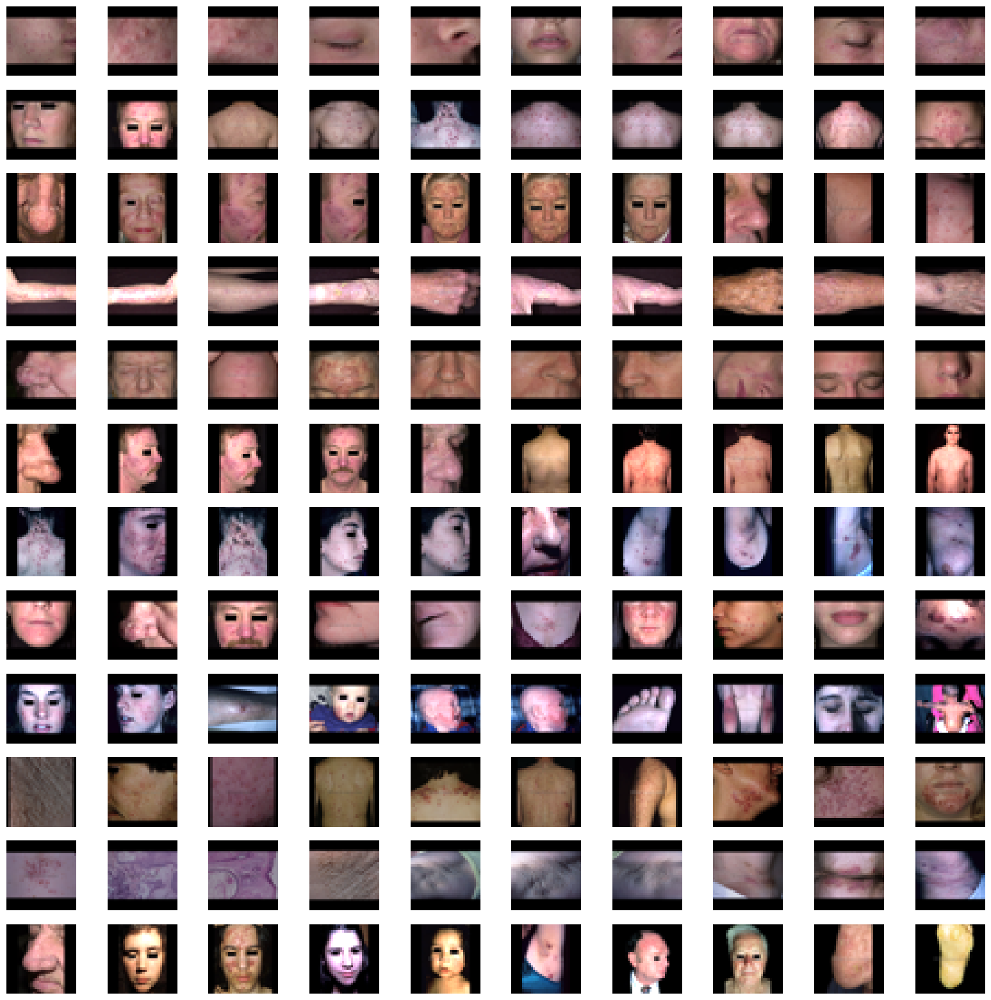

In [12]:
# Define the number of clusters
num_clusters = 12  # Choose an appropriate number of clusters

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(features)

plot_clusters(images_array, clusters, num_clusters)

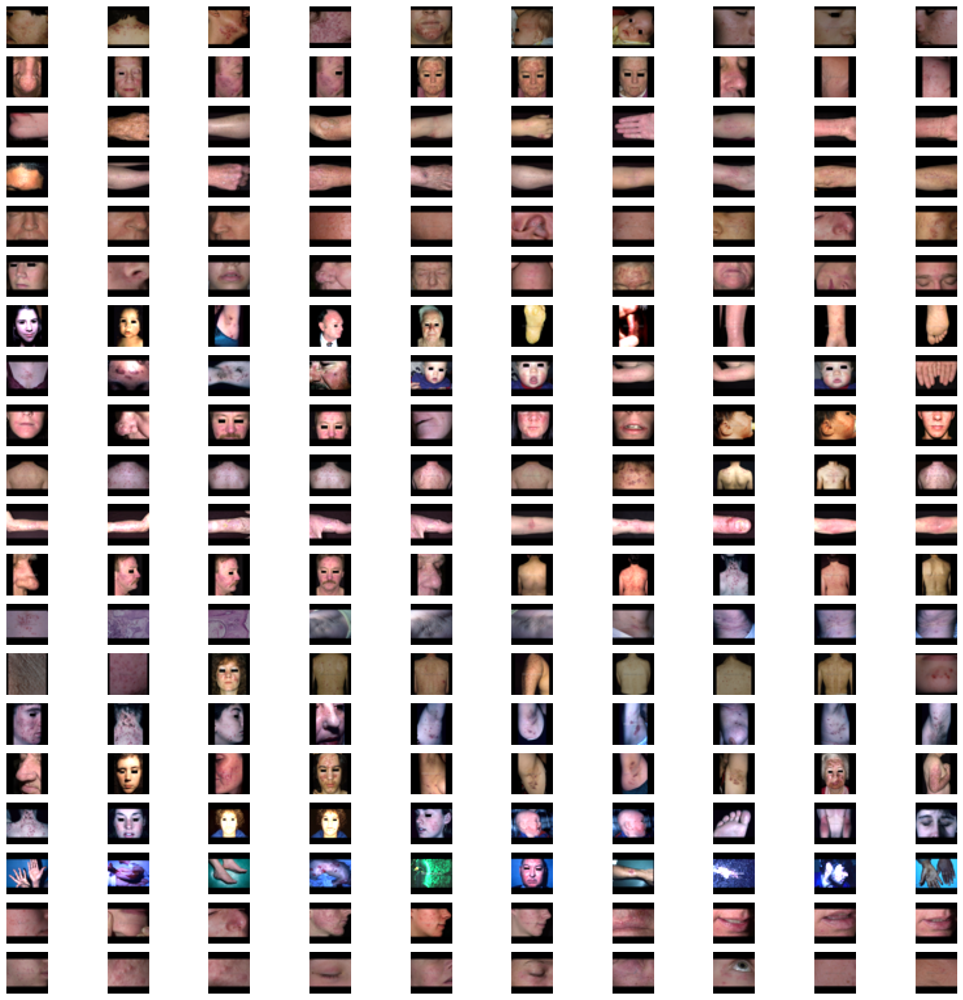

In [14]:
# Define the number of clusters
num_clusters = 20  # Choose an appropriate number of clusters

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(features)

plot_clusters(images_array, clusters, num_clusters)

### Testing with standarization

In [15]:
scaler = StandardScaler()
scaler.fit(features_original)
features_original = scaler.transform(features_original)
features = features_original.copy()

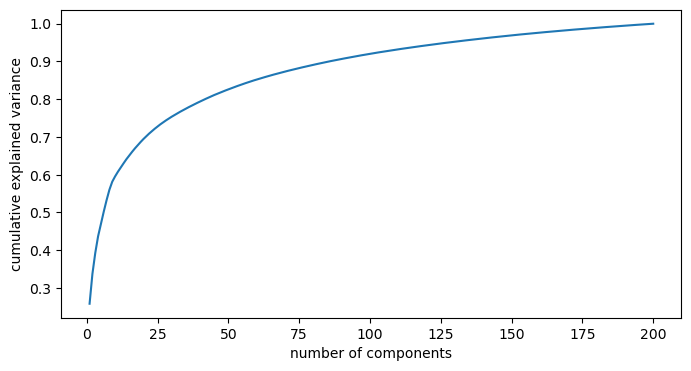

In [16]:
features = reduce_dimensions_pca(200, features_original, True)

2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 

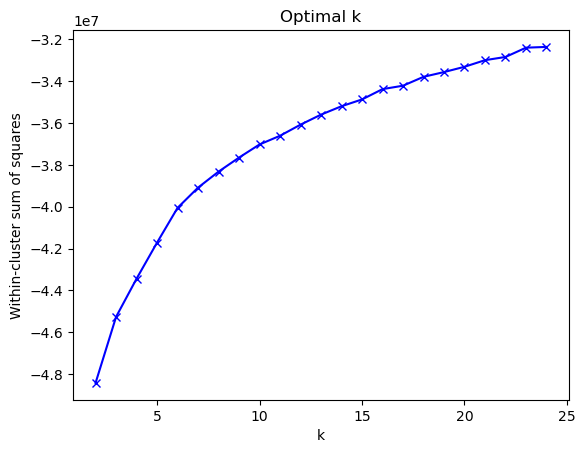

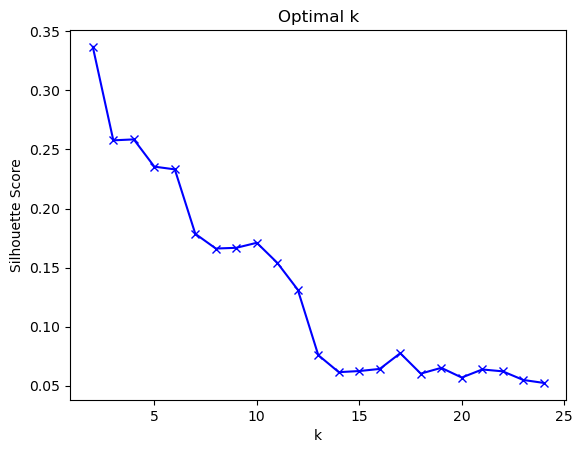

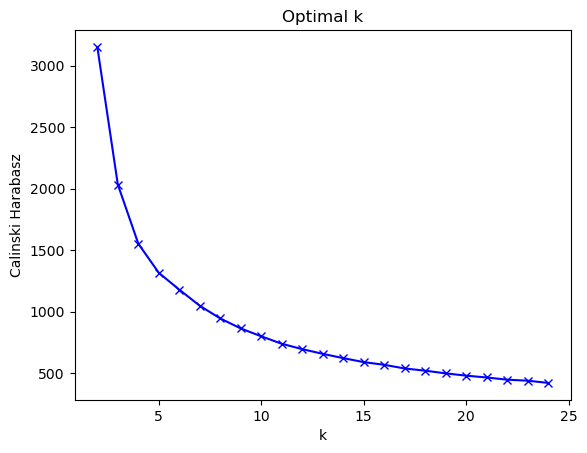

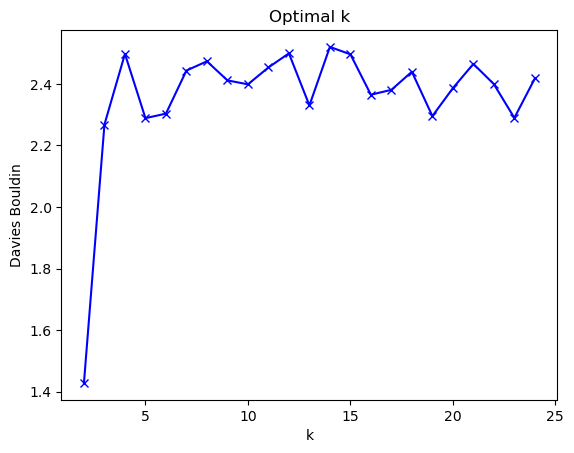

In [17]:
metrics_plots(25, features)

In [18]:
df = create_data_frame(25, features)
df.head()

Kmeans                           [-2-3-4-5-6-7-8-9-10-11-12-13-14-15-16-17-18-19-20-21-22-23-24-25-]


,Algorithm,Parameters,Feature_len,min dist between clusters,mean dist in clust,std dev dist in clust,mean dist to clust center,silhouette,WCSS
0,Kmeans,2.0,200.0,18.078519,92.341226,9.231294,63.334839,0.336886,48418448.0
1,Kmeans,3.0,200.0,13.763616,94.914169,22.302865,65.244895,0.257754,45262168.0
2,Kmeans,4.0,200.0,13.763616,101.757921,30.258028,69.965788,0.258569,43436868.0
3,Kmeans,5.0,200.0,16.394623,100.255594,29.518204,66.420217,0.235611,41712188.0
4,Kmeans,6.0,200.0,13.173648,95.803488,27.772100,66.011117,0.233227,40051416.0


In [19]:
df

,Algorithm,Parameters,Feature_len,min dist between clusters,mean dist in clust,std dev dist in clust,mean dist to clust center,silhouette,WCSS
0,Kmeans,2.0,200.0,18.078519,92.341226,9.231294,63.334839,0.336886,48418448.0
1,Kmeans,3.0,200.0,13.763616,94.914169,22.302865,65.244895,0.257754,45262168.0
2,Kmeans,4.0,200.0,13.763616,101.757921,30.258028,69.965788,0.258569,43436868.0
3,Kmeans,5.0,200.0,16.394623,100.255594,29.518204,66.420217,0.235611,41712188.0
4,Kmeans,6.0,200.0,13.173648,95.803488,27.772100,66.011117,0.233227,40051416.0
5,Kmeans,7.0,200.0,13.173648,93.474682,27.441239,64.448421,0.177915,39084440.0
6,Kmeans,8.0,200.0,13.173648,93.678564,27.793023,64.668831,0.167213,38320552.0
7,Kmeans,9.0,200.0,13.173648,117.613003,95.766351,83.225421,0.167159,37626448.0
8,Kmeans,10.0,200.0,11.375018,149.555483,88.677730,86.040457,0.164910,37042452.0
9,Kmeans,11.0,200.0,4.912380,109.384729,78.718812,84.197865,0.170065,36557352.0


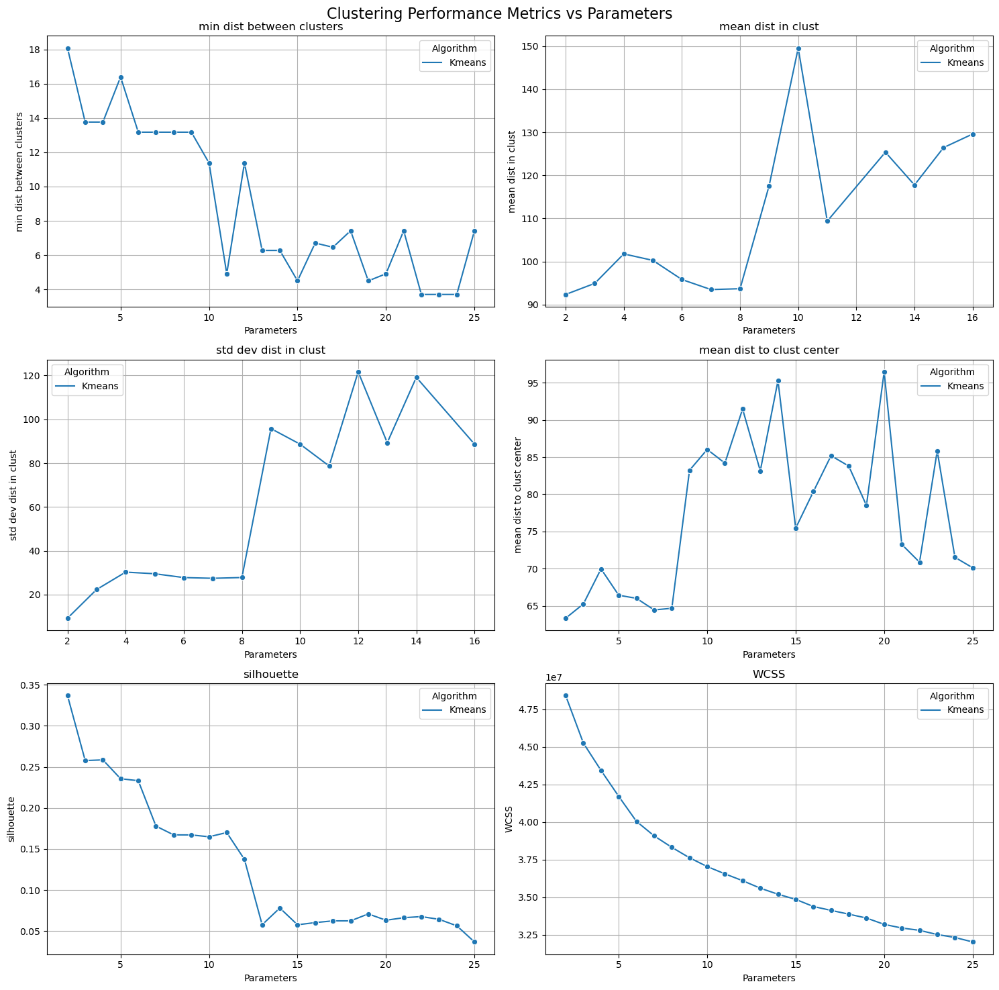

In [20]:
plot_df(df)

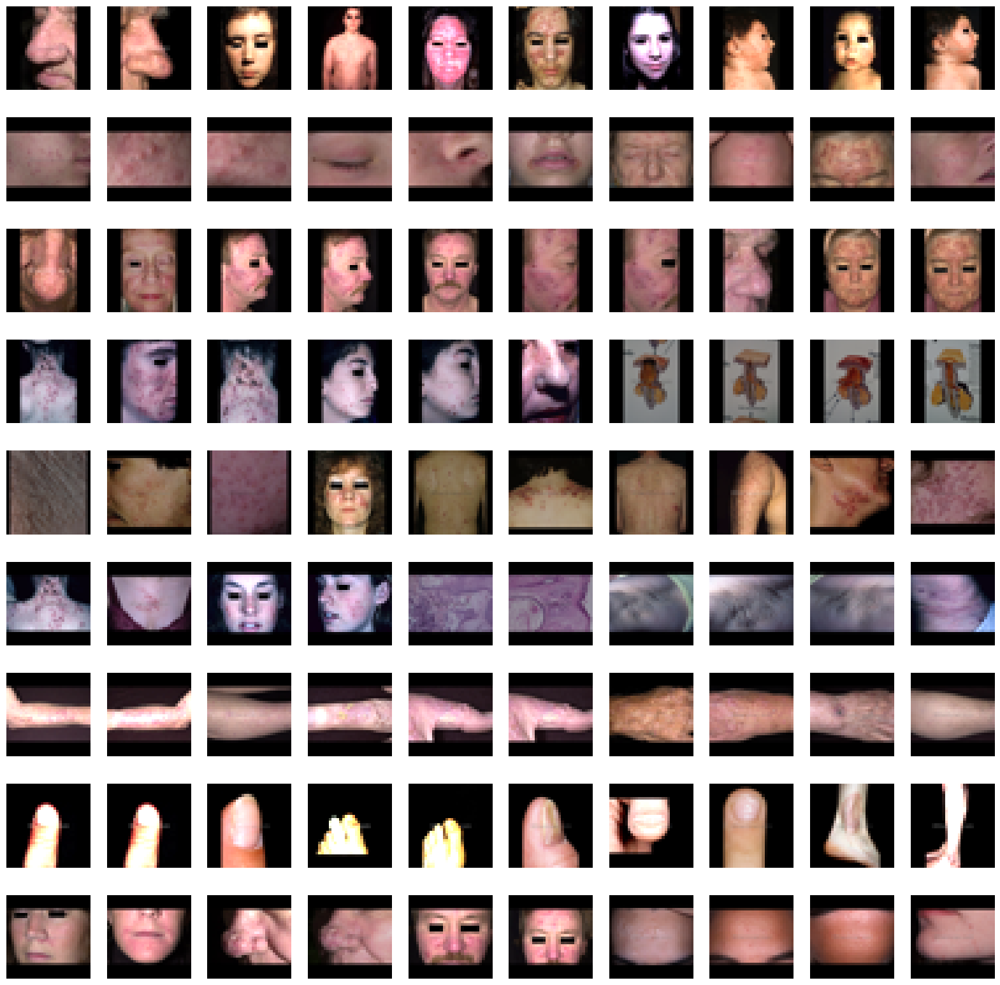

In [24]:
# Define the number of clusters
num_clusters = 9  # Choose an appropriate number of clusters

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(features)

plot_clusters(images_array, clusters, num_clusters)

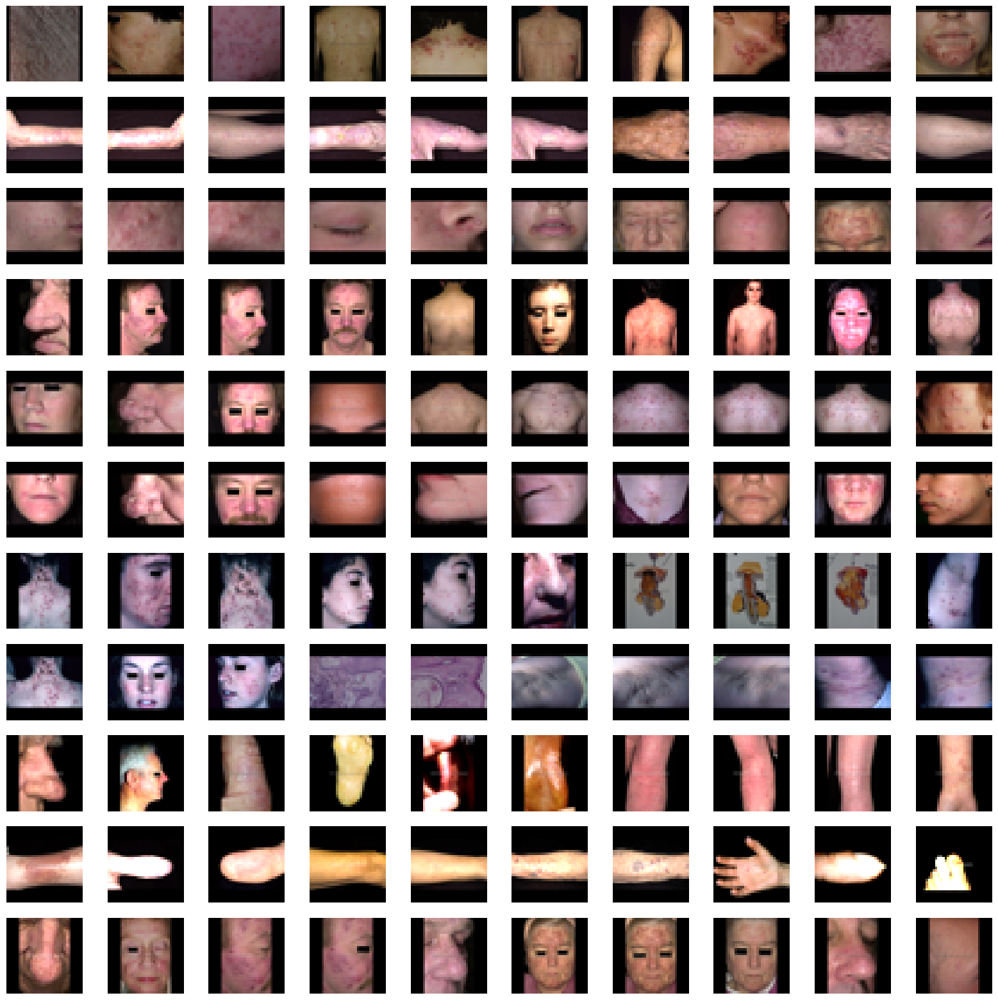

In [21]:
# Define the number of clusters
num_clusters = 11  # Choose an appropriate number of clusters

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(features)

plot_clusters(images_array, clusters, num_clusters)

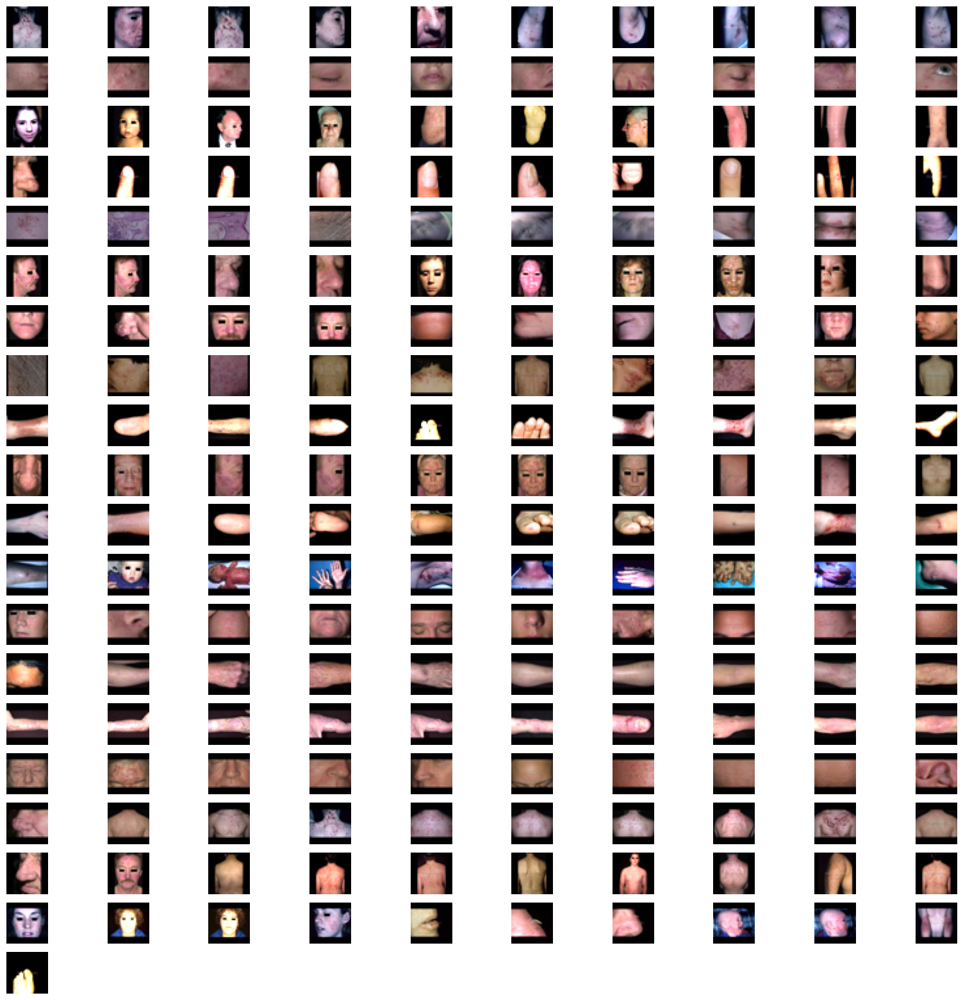

In [22]:
# Define the number of clusters
num_clusters = 20  # Choose an appropriate number of clusters

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(features)

plot_clusters(images_array, clusters, num_clusters)

# Final note

Best performing model was KMeans using features extracted from CNN.

Images' brightness was adjusted and a zero-padding was added to make them square.

Standarizatiion worsened the results. 

Dimensions were reduced with PCA with 200 components.

Metrics:\
Clulsters 12.0
Feature_len	min dist between clusters 0.870044
mean dist in clust 7.782405
std dev dist in clust 1.893583
mean dist to clust center 5.448432
silhouette 0.141528
WCSS 256540.000000					

# Finished  model pipeline

In [13]:
def CNN_KMeans_clusters(path, limiting=0, clusters_num=12):

    def add_padding_to_make_square(img):
        """
        Add padding to an image to make it square.
        """
        width, height = img.size
        if width == height:
            return img
        else:
            max_side = max(width, height)
            new_img = ImageOps.expand(img, (
                (max_side - width) // 2, 
                (max_side - height) // 2, 
                (max_side - width + 1) // 2, 
                (max_side - height + 1) // 2
            ), fill=(0, 0, 0))
            return new_img

    def adjust_brightness(img, target_brightness):
        """
        Adjust the brightness of an image to match the target brightness.
        """
        grayscale_img = img.convert('L')
        img_array = np.array(grayscale_img)

        current_brightness = np.mean(img_array)
        brightness_factor = target_brightness / current_brightness

        img_array = np.array(img, dtype=np.float32)
        img_array = img_array * brightness_factor

        img_array = np.clip(img_array, 0, 255).astype(np.uint8)

        return Image.fromarray(img_array)

    def normalize_images_brightness(images, target_brightness=None):
        """
        Normalize the brightness of all images to match the target brightness.
        """
        if target_brightness is None:
            total_brightness = 0
            for img in images:
                grayscale_img = img.convert('L')
                img_array = np.array(grayscale_img)
                total_brightness += np.mean(img_array)
            target_brightness = total_brightness / len(images)

        normalized_images = [adjust_brightness(img, target_brightness) for img in images]

        return normalized_images
    
    def reduce_dimensions_pca(pca_components, features):

        features = PCA(n_components=pca_components).fit_transform(features)

        pca = PCA().fit(features)

        return features

    # Load images from directory and pad them to be square, then resize to 32x32
    data_dir = path
    img_size = 32
    images = []
    if limiting==0:
        for root, dirs, files in os.walk(data_dir):
            for file in files:
                if file.endswith('.jpg'):
                    file_path = os.path.join(root, file)
                    img = Image.open(file_path)
                    img = add_padding_to_make_square(img)
                    img = img.resize((img_size, img_size))
                    images.append(img)
    else:
        for root, dirs, files in os.walk(data_dir):
            for file in files[:limiting]:
                if file.endswith('.jpg'):
                    file_path = os.path.join(root, file)
                    img = Image.open(file_path)
                    img = add_padding_to_make_square(img)
                    img = img.resize((img_size, img_size))
                    images.append(img)

    # Normalize the brightness of all images
    normalized_images = normalize_images_brightness(images)

    # Convert normalized images to numpy array
    images_array = np.array([np.array(img) / 255.0 for img in images])
    
    # Define the autoencoder model
    input_img = Input(shape=(img_size, img_size, 3))  # Adjust shape based on your images

    # Encoder
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)
    encoded = Conv2D(128, (3, 3), activation='relu', padding='same')(x)

    # Decoder
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(encoded)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)
    decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

    # Autoencoder
    autoencoder = Model(input_img, decoded)
    autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

    # Train the autoencoder
    train, test = train_test_split(images_array, test_size=0.7, random_state=42)
    autoencoder.fit(train, test,
                    epochs=50,
                    batch_size=256,
                    shuffle=True,
                    validation_split=0.2)

    # Create encoder model
    encoder = Model(input_img, encoded)

    # Extract features
    features = encoder.predict(images_array)
    features = features.reshape((features.shape[0], -1))  # Flatten the features for clustering

    # PCA dimensionality reduction
    features = reduce_dimensions_pca(200, features)
    
    # Define the number of clusters
    num_clusters = clusters_num

    # Apply K-means clustering
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    clusters = kmeans.fit_predict(features)

    return images_array, clusters, num_clusters

def plot_clusters(images, labels, num_clusters):
    plt.figure(figsize=(20, 20))
    for cluster in range(num_clusters):
        cluster_images = images[labels == cluster]
        for i in range(min(len(cluster_images), 10)):
            plt.subplot(num_clusters, 10, cluster * 10 + i + 1)
            plt.imshow(cluster_images[i])
            plt.axis('off')
    plt.show()

In [14]:
# Example of usage
# Inputs:
# 1) Provide the function with a path to images (all subdirectories will be searched).
# 2) The number of images taken from each subdirectory. Value 0 means all images will be read. (deefault=0)
# Outputs:
# 1) An array of images.
# 2) Created clusters.
# 3) Number of created clusters.
images_array, clusters, num_clusters = CNN_KMeans_clusters('../Data/train', limiting=500)

In [15]:
# Function below plots created clusters.
# Each row is a cluster with sample images.
plot_clusters(images_array, clusters, num_clusters)